## Άγγελος Μητροκώτσας 03118197

<h2>2<sup>η</sup> ΕΡΓΑΣΤΗΡΙΑΚΗ ΑΣΚΗΣΗ</h2>
<h3>Ανάλυση Κοινωνικής Δομής σε Τεχνητές και Πραγματικές Σύνθετες Τοπολογίες Δικτύων</h3>
<p style=text-align:justify>Στην παρούσα άσκηση θα αναλυθούν τεχνητές και πραγματικές τοπολογίες σύνθετων δικτύων με βάση τις μετρικές που χρησιμοποιήθηκαν στην προηγούμενη άσκηση και κάποιες τεχνικές που έχουν ως στόχο την εύρεση κοινωνικής δομής. Συγκεκριμένα, θα χρησιμοποιηθούν και θα συγκριθούν διάφοροι αλγόριθμοι εντοπισμού κοινοτήτων σε γράφους δικτύων που προκύπτουν από πραγματικά δεδομένα καθώς και στους συνθετικούς γράφους της πρώτης εργαστηριακής άσκησης.</p>

In [3]:
!pip install 'networkx<2.7' #για να μην πεταει AttributeError: module 'scipy.sparse' has no attribute 'coo_array' στο email-EU-core network

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.9 MB 5.3 MB/s 
  Attempting uninstall: networkx
    Found existing installation: networkx 2.8.8
    Uninstalling networkx-2.8.8:
      Successfully uninstalled networkx-2.8.8


In [4]:
%matplotlib inline

import matplotlib
import networkx as nx
import random
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
from sklearn.cluster import SpectralClustering

<h3>Α. Μελέτη πραγματικών τοπολογιών</h3>
<p style=text-align:justify>Στο παρόν ερώτημα θα μελετήσετε και θα αποκτήσετε αίσθηση της τοπολογικής δομής πραγματικών δικτύων. Πιο συγκεκριμένα, για τις τοπολογίες που φαίνονται στον <b>πίνακα 1</b>, να βρεθούν και να δειχθούν:</p>
<ol>
    <li>Η κατανομή του βαθμού κόμβου και ο μέσος βαθμός κάθε τοπολογίας.</li>
    <li>Η κατανομή του συντελεστή ομαδοποίησης κόμβου και ο μέσος συντελεστής ομαδοποίησης κάθε τοπολογίας.</li>
    <li>Η κατανομή της κεντρικότητας εγγύτητας και η μέση κεντρικότητα εγγύτητας κάθε τοπολογίας.</li>
</ol>
<p style=text-align:justify>Να συγκριθούν τα αποτελέσματα σε σχέση με αυτά των συνθετικών τοπολογιών. Να χαρακτηρίσετε τον τύπο κάθε μίας από τις πραγματικές τοπολογίες με βάση τους τύπους δικτύων που εξετάστηκαν στην πρώτη εργαστηριακή άσκηση.</p>

<table style=width:100%>
    <caption>Πίνακας <b>1</b>: Πραγματικές τοπολογίες</a></caption>
<tr>
    <th style=text-align:left>Τοπολογία</th>
    <th style=text-align:left>Αρχείο</th>
    <th style=text-align:left>Περιγραφή</th>
</tr>
<tr>
    <td style=text-align:left>American College Football</td>
    <td style=text-align:left><a style=text-decoration:none href='http://www-personal.umich.edu/~mejn/netdata/football.zip'>football.gml</a></td>
    <td style=text-align:left><p style=text-align:justify> The file <b>football.gml</b> contains the network of American football games between Division IA colleges during regular season Fall 2000, as compiled by M. Girvan and M. Newman. The nodes have values that indicate to which conferences they belong.</p>
    </td>
</tr>  
<tr>
    <td style=text-align:left>Game of Thrones - season 5</td>
    <td style=text-align:left><a style=text-decoration:none href='https://networkofthrones.wordpress.com/the-series/season-5/'>GoT</a></td>
    <td style=text-align:left><p style=text-align:justify> The season 5 <b>GoT</b> network represents the interactions between the characters of Game of Thrones in season 5. The season 5 network has 118 nodes (characters) and 394 weighted edges, corresponding to 5,139 interactions. Data can be found here: <a style=text-decoration:none href='https://raw.githubusercontent.com/mathbeveridge/gameofthrones/master/data/got-s5-edges.csv'>GoT_data</a></p>
</tr> 
<tr>
    <td style=text-align:left>email-Eu-core</td>
    <td style=text-align:left><a style=text-decoration:none href='https://snap.stanford.edu/data/email-Eu-core.html'>email-eu-core</a></td>
    <td style=text-align:left><p style=text-align:justify> The network <b>email-Eu-core</b> was generated using email data from a large European research institution. There is an edge (u, v) in the network if person u sent person v at least one email. The e-mails only represent communication between institution members (the core) and the dataset does not contain incoming messages from or outgoing messages to the rest of the world. The dataset also contains "ground-truth" community memberships of the nodes. Each individual belongs to exactly one of 42 departments at the research institute. </p>
</tr> 
    
</table>

<h4>Παραγωγή συνθετικών τοπολογιών</h4> 
<p>Προσοχή! Τα δίκτυα που θα παράξετε θα πρέπει να είναι συνδεδεμένα.</p>


 
 Regular Graph (REG) : 


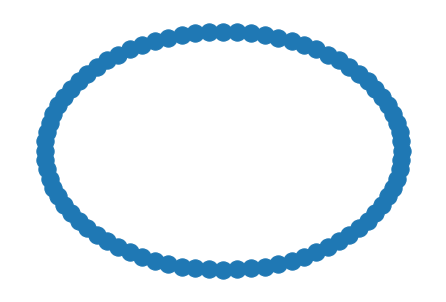


 
 Random Graph - Erdos-Renyi (RG(ER)) : 


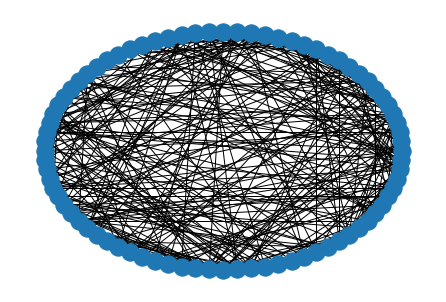


 
 Random Geometric Graph (RGG) :


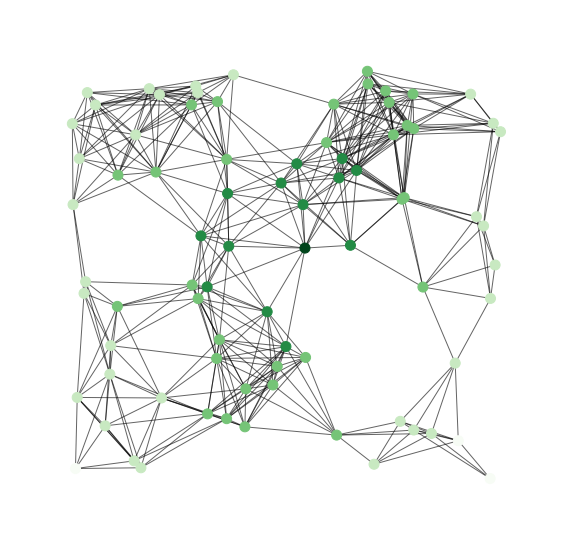


 
 Scale Free (SF) : 


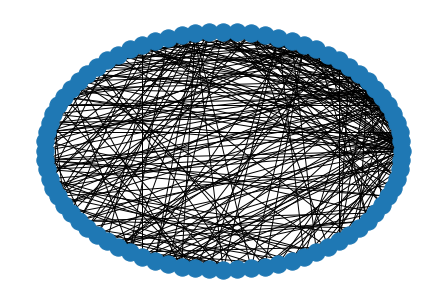


 
 Small World (SW) : 


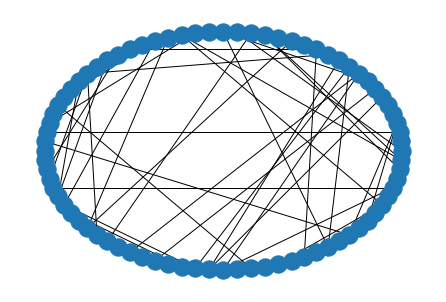

In [5]:
n=80
d=4 # = k
M=300
R=0.25
p=0.3
k=4
seedno=5
random.seed(seedno)

REG = nx.watts_strogatz_graph(n,d, 0, seedno)
RGER = nx.gnm_random_graph(n, M, seedno, False) 
RGG = nx.random_geometric_graph(n, R, 2, None, 2 , seedno)
SF = nx.barabasi_albert_graph(n,d,seedno, None)
SW = nx.watts_strogatz_graph(n, d, p, seedno)

graph = [REG, RGER, RGG, SF, SW]
graph_name = ['Regular Graph (REG)', 'Random Graph - Erdos-Renyi (RG(ER))', 'Random Geometric Graph (RGG)', 'Scale Free (SF)', 'Small World (SW)']
for i in range(0, len(graph)):
  if(not nx.is_connected(graph[i])):
    print("ERROR: The graph", graph_name[i] ,"is not connected \n")
    break
  
  if(graph_name[i] == 'Random Geometric Graph (RGG)'):
    pos = nx.get_node_attributes(RGG, "pos")

    # find node near center (0.5,0.5)
    dmin = 1
    ncenter = 0
    for n in pos:
        x, y = pos[n]
        d = (x - 0.5) ** 2 + (y - 0.5) ** 2
        if d < dmin:
            ncenter = n
            dmin = d

    # color by path length from node near center
    p = dict(nx.single_source_shortest_path_length(RGG, ncenter))
    print('\n \n', graph_name[i], ':')
    plt.figure(figsize=(10, 10))
    nx.draw_networkx_edges(RGG, pos, alpha=0.6) #ηθελα λιγο πιο ευδιακριτες τις ακμες, στο link το ειχε 0.4
    nx.draw_networkx_nodes(
        RGG,
        pos,
        nodelist=list(p.keys()),
        node_size=100,
        node_color=list(p.values()),
        cmap=plt.cm.Greens_r,
    )

    plt.xlim(-0.15, 1.15)
    plt.ylim(-0.15, 1.15)
    plt.axis("off")
    plt.show()
  else:
    print('\n \n', graph_name[i], ': ')
    plt.figure()
    nx.draw_circular(graph[i])
    plt.show()
  
 

<h4>Εισαγωγή και οπτικοποίηση πραγματικών τοπολογιών.</h4>

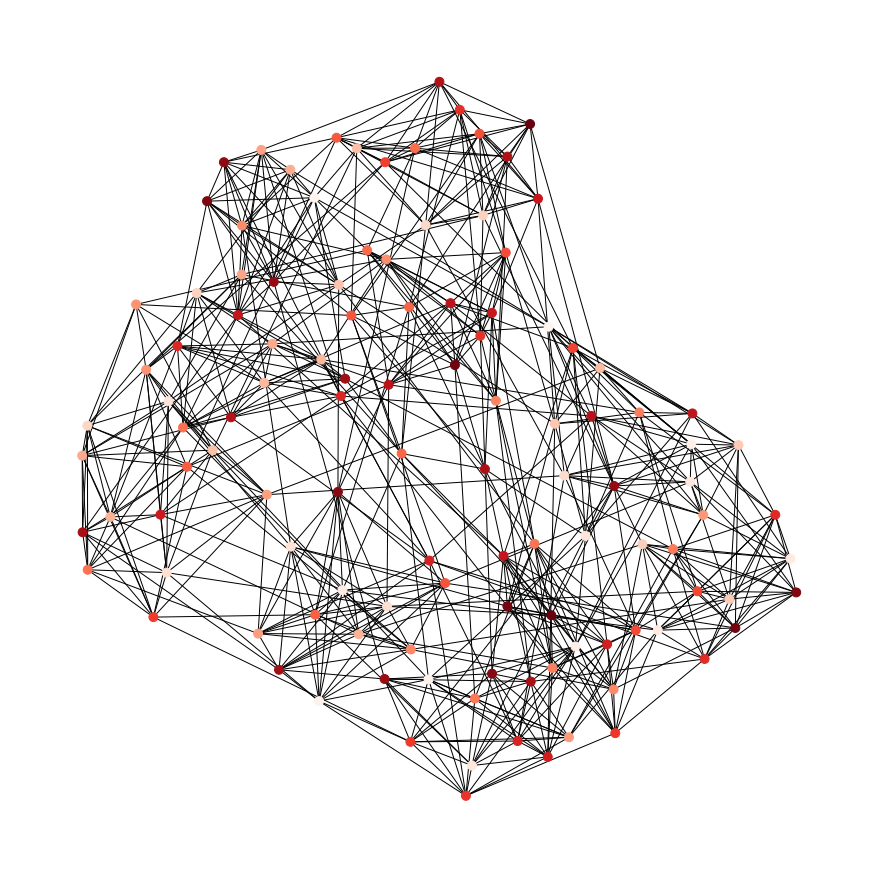

In [6]:
#football network
football=nx.read_gml(r"football.gml")

#οπτικοποιηση
plt.figure(figsize = (12,12))
nx.draw(football, node_size=80,node_color = range(len(football)), cmap = plt.cm.Reds)

#προσθηκη στη λιστα
graph.append(football)
graph_name.append('American College Football')

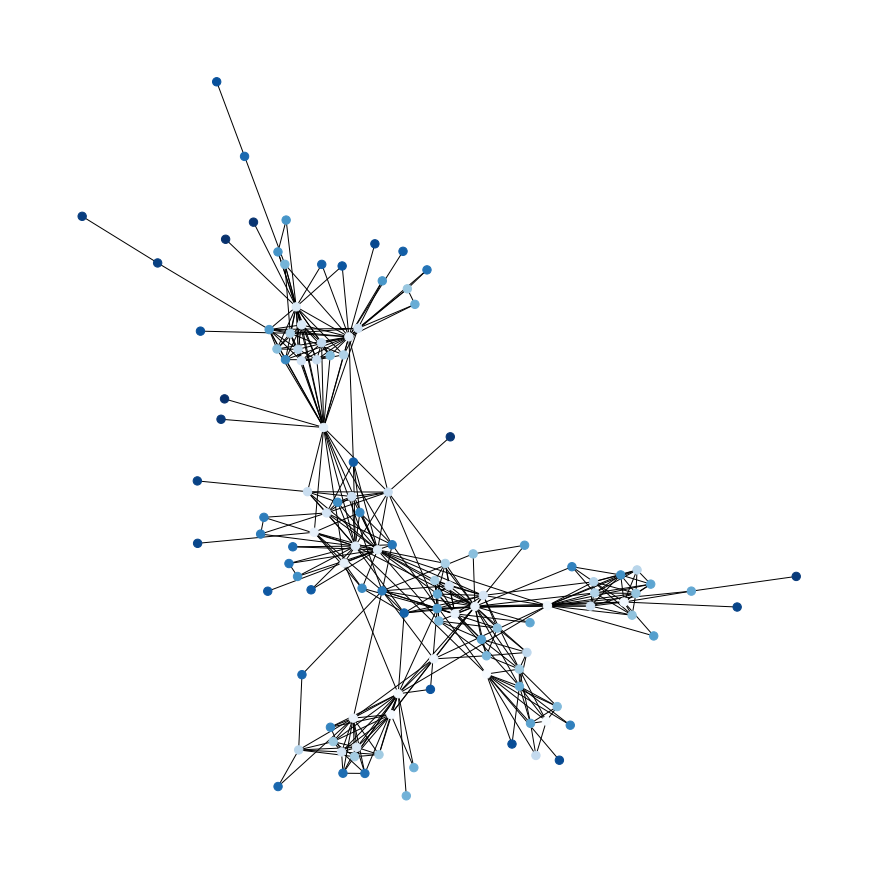

In [7]:
#Game of thrones network
import csv
got=nx.Graph()
with open('got_s5.csv') as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    line_count = 0
    next(csv_reader)
    for row in csv_reader:
        got.add_edge(row[0],row[1])
        line_count += 1
#οπτικοποιηση
plt.figure(figsize=(12,12))
nx.draw(got, node_size=70,node_color = range(len(got)), cmap = plt.cm.Blues)
#προσθηκη στη λιστα
graph.append(got)
graph_name.append('Game of Thrones - season 5')

#### Προσοχή! Θα μελετήσετε τη μεγαλύτερη συνδεδεμένη συνιστώσα του δικτύου email-Eu-core, αφού πρώτα αφαιρέσετε τα self-loops. Μπορείτε να κάνετε χρήση των συναρτήσεων connected_components, subgraph, remove_edges_from του networkx.

email_Eu_core is connected : True


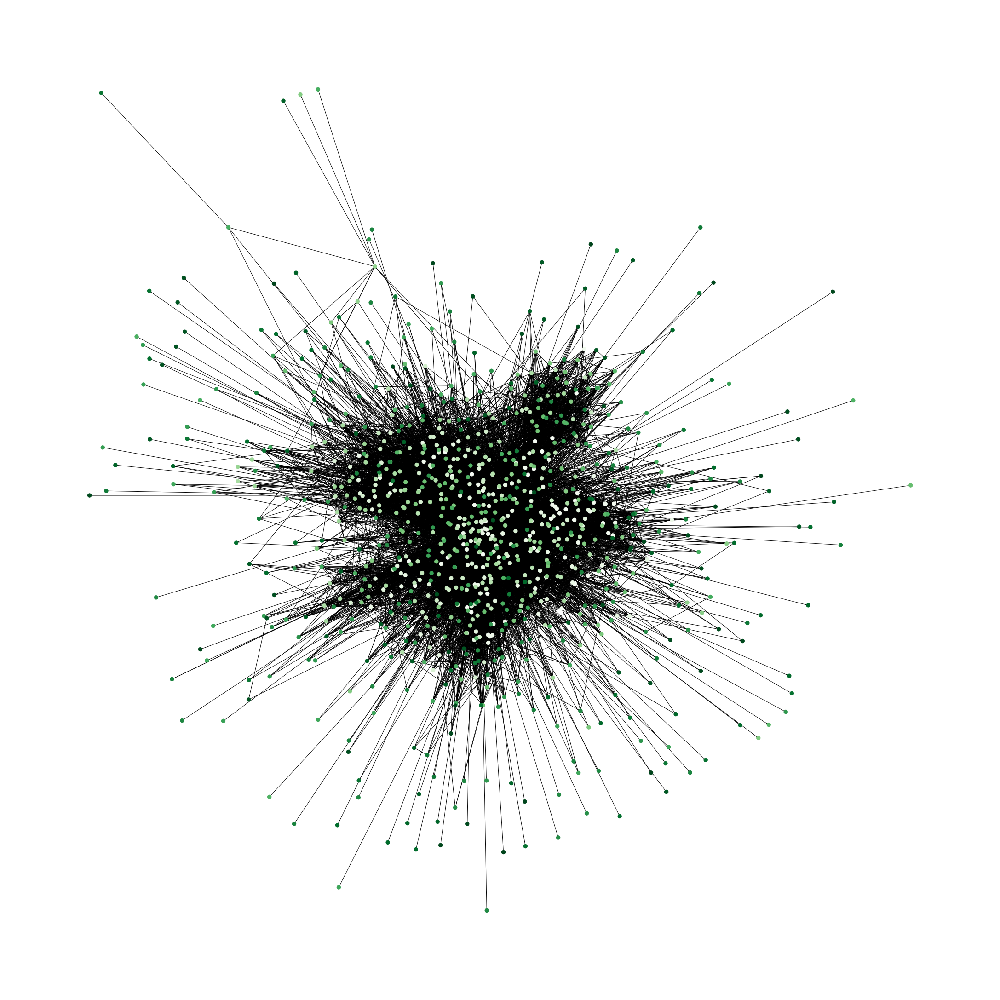

In [8]:
#email-Eu-core network
eu=nx.read_edgelist("email-Eu-core.txt",create_using=nx.Graph())
#βγαζω τους κυκλους (self loops)
eu.remove_edges_from(nx.selfloop_edges(eu))
#max συνδεδεμενη συνιστώσα
largest_eu = max(nx.connected_components(eu), key=len)
eu =  eu.subgraph(largest_eu)
print("email_Eu_core is connected : " + str(nx.is_connected(eu)))
plt.figure(figsize=(30,30))
nx.draw(eu, node_size=70, node_color = range(len(eu)), cmap = plt.cm.Greens)

#προσθηκη στη λιστα
graph.append(eu)
graph_name.append('email-Eu-core')

In [9]:
# print(graph)
# print(graph_name)

<h4>Μελέτη βαθμού κόμβου για πραγματικές και συνθετικές τοπολογίες.</h4>

For  Regular Graph (REG) : 
{0: 4, 1: 4, 2: 4, 3: 4, 4: 4, 5: 4, 6: 4, 7: 4, 8: 4, 9: 4, 10: 4, 11: 4, 12: 4, 13: 4, 14: 4, 15: 4, 16: 4, 17: 4, 18: 4, 19: 4, 20: 4, 21: 4, 22: 4, 23: 4, 24: 4, 25: 4, 26: 4, 27: 4, 28: 4, 29: 4, 30: 4, 31: 4, 32: 4, 33: 4, 34: 4, 35: 4, 36: 4, 37: 4, 38: 4, 39: 4, 40: 4, 41: 4, 42: 4, 43: 4, 44: 4, 45: 4, 46: 4, 47: 4, 48: 4, 49: 4, 50: 4, 51: 4, 52: 4, 53: 4, 54: 4, 55: 4, 56: 4, 57: 4, 58: 4, 59: 4, 60: 4, 61: 4, 62: 4, 63: 4, 64: 4, 65: 4, 66: 4, 67: 4, 68: 4, 69: 4, 70: 4, 71: 4, 72: 4, 73: 4, 74: 4, 75: 4, 76: 4, 77: 4, 78: 4, 79: 4}
The mean node degree is:  4.0 



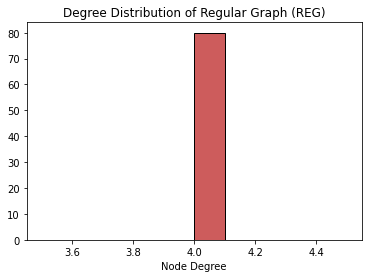

For  Random Graph - Erdos-Renyi (RG(ER)) : 
{0: 6, 1: 6, 2: 6, 3: 7, 4: 14, 5: 7, 6: 7, 7: 7, 8: 11, 9: 5, 10: 7, 11: 5, 12: 4, 13: 5, 14: 7, 15: 8, 16: 5, 17: 10, 18: 10, 19: 9, 20: 11, 21: 8, 22: 7, 23: 13, 24: 3, 25: 10, 26: 6, 27: 5, 28: 6, 29: 2, 30: 9, 31: 7, 32: 9, 33: 4, 34: 5, 35: 9, 36: 9, 37: 18, 38: 8, 39: 8, 40: 8, 41: 6, 42: 6, 43: 8, 44: 10, 45: 10, 46: 10, 47: 10, 48: 9, 49: 8, 50: 3, 51: 7, 52: 6, 53: 8, 54: 5, 55: 6, 56: 4, 57: 3, 58: 7, 59: 10, 60: 13, 61: 14, 62: 8, 63: 6, 64: 4, 65: 4, 66: 7, 67: 5, 68: 6, 69: 7, 70: 12, 71: 4, 72: 7, 73: 7, 74: 6, 75: 7, 76: 9, 77: 5, 78: 9, 79: 13}
The mean node degree is:  7.5 



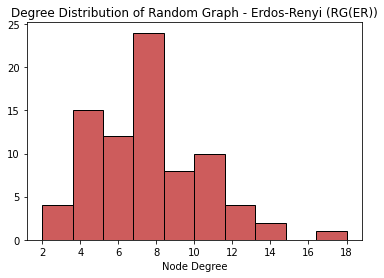

For  Random Geometric Graph (RGG) : 
{0: 17, 1: 15, 2: 16, 3: 6, 4: 8, 5: 6, 6: 11, 7: 13, 8: 9, 9: 13, 10: 6, 11: 7, 12: 10, 13: 9, 14: 13, 15: 9, 16: 10, 17: 14, 18: 14, 19: 13, 20: 6, 21: 12, 22: 8, 23: 12, 24: 8, 25: 15, 26: 8, 27: 11, 28: 5, 29: 3, 30: 18, 31: 9, 32: 12, 33: 5, 34: 14, 35: 17, 36: 10, 37: 15, 38: 13, 39: 11, 40: 17, 41: 9, 42: 10, 43: 15, 44: 12, 45: 10, 46: 13, 47: 8, 48: 12, 49: 8, 50: 4, 51: 13, 52: 18, 53: 13, 54: 12, 55: 6, 56: 7, 57: 13, 58: 19, 59: 9, 60: 14, 61: 12, 62: 8, 63: 5, 64: 14, 65: 12, 66: 11, 67: 8, 68: 8, 69: 14, 70: 11, 71: 17, 72: 16, 73: 15, 74: 19, 75: 12, 76: 11, 77: 14, 78: 10, 79: 10}
The mean node degree is:  11.25 



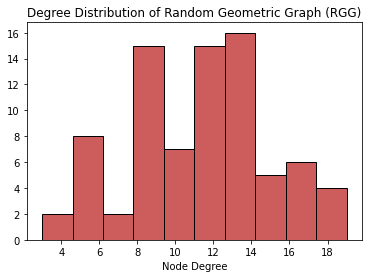

For  Scale Free (SF) : 
{0: 40, 1: 7, 2: 27, 3: 1, 4: 15, 5: 22, 6: 17, 7: 11, 8: 22, 9: 12, 10: 12, 11: 10, 12: 8, 13: 12, 14: 13, 15: 10, 16: 8, 17: 5, 18: 13, 19: 4, 20: 11, 21: 9, 22: 16, 23: 7, 24: 5, 25: 7, 26: 9, 27: 5, 28: 5, 29: 7, 30: 8, 31: 6, 32: 6, 33: 5, 34: 6, 35: 7, 36: 5, 37: 5, 38: 4, 39: 6, 40: 4, 41: 8, 42: 5, 43: 6, 44: 6, 45: 7, 46: 8, 47: 4, 48: 6, 49: 8, 50: 5, 51: 6, 52: 6, 53: 7, 54: 4, 55: 5, 56: 4, 57: 6, 58: 5, 59: 4, 60: 4, 61: 4, 62: 4, 63: 6, 64: 4, 65: 5, 66: 4, 67: 4, 68: 4, 69: 5, 70: 4, 71: 4, 72: 5, 73: 5, 74: 4, 75: 4, 76: 4, 77: 4, 78: 4, 79: 4}
The mean node degree is:  7.6 



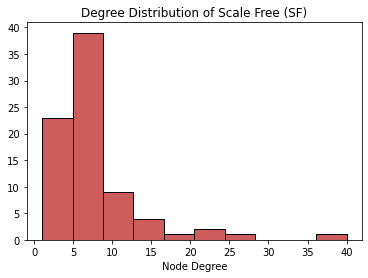

For  Small World (SW) : 
{0: 4, 1: 3, 2: 4, 3: 5, 4: 5, 5: 3, 6: 4, 7: 3, 8: 4, 9: 3, 10: 4, 11: 4, 12: 3, 13: 3, 14: 3, 15: 3, 16: 3, 17: 4, 18: 3, 19: 4, 20: 3, 21: 3, 22: 3, 23: 5, 24: 4, 25: 3, 26: 3, 27: 5, 28: 4, 29: 3, 30: 4, 31: 5, 32: 3, 33: 3, 34: 5, 35: 4, 36: 5, 37: 4, 38: 3, 39: 3, 40: 4, 41: 3, 42: 5, 43: 6, 44: 4, 45: 6, 46: 6, 47: 5, 48: 4, 49: 6, 50: 4, 51: 4, 52: 4, 53: 5, 54: 4, 55: 5, 56: 4, 57: 4, 58: 4, 59: 5, 60: 4, 61: 3, 62: 5, 63: 4, 64: 4, 65: 5, 66: 4, 67: 4, 68: 6, 69: 3, 70: 5, 71: 4, 72: 4, 73: 3, 74: 5, 75: 4, 76: 3, 77: 3, 78: 3, 79: 5}
The mean node degree is:  4.0 



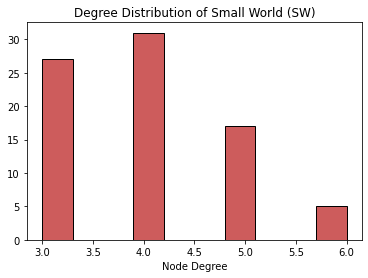

For  American College Football : 
{'BrighamYoung': 12, 'FloridaState': 12, 'Iowa': 12, 'KansasState': 12, 'NewMexico': 11, 'TexasTech': 12, 'PennState': 12, 'SouthernCalifornia': 12, 'ArizonaState': 11, 'SanDiegoState': 11, 'Baylor': 10, 'NorthTexas': 10, 'NorthernIllinois': 10, 'Northwestern': 11, 'WesternMichigan': 10, 'Wisconsin': 12, 'Wyoming': 11, 'Auburn': 11, 'Akron': 11, 'VirginiaTech': 11, 'Alabama': 11, 'UCLA': 11, 'Arizona': 11, 'Utah': 11, 'ArkansasState': 10, 'NorthCarolinaState': 11, 'BallState': 10, 'Florida': 11, 'BoiseState': 9, 'BostonCollege': 11, 'WestVirginia': 11, 'BowlingGreenState': 11, 'Michigan': 11, 'Virginia': 10, 'Buffalo': 11, 'Syracuse': 11, 'CentralFlorida': 8, 'GeorgiaTech': 11, 'CentralMichigan': 11, 'Purdue': 11, 'Colorado': 11, 'ColoradoState': 10, 'Connecticut': 7, 'EasternMichigan': 11, 'EastCarolina': 11, 'Duke': 11, 'FresnoState': 11, 'OhioState': 11, 'Houston': 11, 'Rice': 11, 'Idaho': 9, 'Washington': 11, 'Kansas': 10, 'SouthernMethodist': 12, 

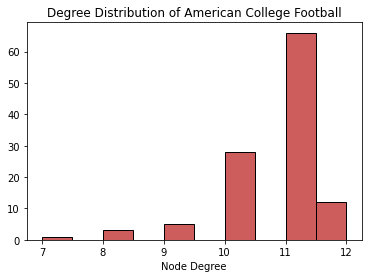

For  Game of Thrones - season 5 : 
{'ARYA': 11, 'JAQEN': 6, 'JORAH': 11, 'TYRION': 19, 'BRONN': 12, 'JAIME': 17, 'VARYS': 7, 'DAENERYS': 14, 'CERSEI': 30, 'HIGH_SPARROW': 11, 'BRIENNE': 8, 'PODRICK': 6, 'JON': 25, 'STANNIS': 24, 'LITTLEFINGER': 25, 'SANSA': 21, 'SAM': 20, 'GILLY': 12, 'DAARIO': 10, 'MARGAERY': 8, 'TOMMEN': 12, 'THEON': 10, 'HIZDAHR': 10, 'DAVOS': 9, 'TORMUND': 8, 'MYRCELLA': 8, 'MYRANDA': 6, 'RAMSAY': 8, 'MELISANDRE': 10, 'ROOSE_BOLTON': 11, 'WAIF': 3, 'SHIREEN': 7, 'QYBURN': 6, 'OLLY': 10, 'BARRISTAN': 7, 'TYENE': 7, 'DORAN': 10, 'ELLARIA': 10, 'MANCE': 6, 'ALLISER_THORNE': 11, 'OLENNA': 6, 'LORAS': 9, 'GREY_WORM': 7, 'MISSANDEI': 6, 'MACE': 10, 'MOSSADOR': 7, 'KARSI': 4, 'AREO': 9, 'TRYSTANE': 6, 'KEVAN': 6, 'MAGGY': 3, 'JANOS': 7, 'SELYSE': 7, 'TYCHO': 5, 'LANCEL': 7, 'PYCELLE': 7, 'MAESTER_AEMON': 5, 'BLACK_HAIRED_PROSTITUTE': 1, 'MALKO': 2, 'MERYN_TRANT': 10, 'LOBODA': 3, 'OLYVAR': 9, 'LOLLYS': 3, 'SEPTA_UNELLA': 2, 'NYMERIA': 6, 'THIN_MAN': 6, 'HIGH_SEPTON': 7, '

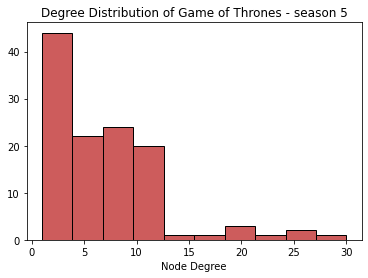

For  email-Eu-core : 
{'0': 42, '1': 50, '2': 93, '3': 69, '4': 94, '5': 169, '6': 113, '7': 70, '8': 35, '9': 38, '10': 47, '11': 74, '12': 56, '13': 178, '14': 78, '15': 50, '16': 74, '17': 109, '18': 54, '19': 70, '20': 72, '21': 136, '22': 13, '23': 79, '24': 38, '25': 33, '26': 33, '27': 61, '28': 103, '29': 56, '30': 66, '31': 48, '32': 33, '33': 28, '34': 29, '35': 57, '36': 43, '37': 35, '38': 45, '39': 34, '40': 58, '41': 89, '42': 73, '43': 12, '44': 104, '45': 46, '46': 71, '47': 49, '48': 57, '49': 13, '50': 15, '51': 67, '52': 24, '53': 40, '54': 49, '55': 41, '56': 46, '57': 65, '58': 124, '59': 51, '60': 53, '61': 69, '62': 214, '63': 123, '64': 168, '65': 89, '66': 34, '67': 9, '68': 46, '69': 62, '70': 18, '71': 16, '72': 8, '73': 29, '74': 91, '75': 20, '76': 22, '77': 25, '78': 23, '79': 42, '80': 70, '81': 111, '82': 231, '83': 139, '84': 130, '85': 37, '86': 216, '87': 137, '88': 31, '89': 69, '90': 27, '91': 29, '92': 42, '93': 85, '94': 42, '95': 46, '96': 118, '

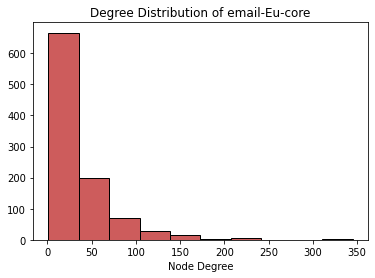

In [10]:
for i in range(0, len(graph)):
  print("For ", graph_name[i],  ": ")
  degrees = dict(nx.degree(graph[i]))
  print(degrees)
  print("The mean node degree is: ", np.mean(list(degrees.values())),'\n')
  plt.title("Degree Distribution of " + str(graph_name[i]))
  plt.xlabel("Node Degree")
  plt.hist(list(degrees.values()), edgecolor = 'black', color = 'indianred')
  plt.show()

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Συγκίνοντας τις μέσες τιμές των πραγματικών δικτύων και των συνθετικών, παρατηρούμε ότι το δίκτυο American College Football είναι ανάμεσα στο RG(ER) και τα REG και RGG, το GoT season 5 είναι σχετικά κοντά στα SF και τα REG και RGG, ενώ το email-EU-core έχει πολύ μεγαλύτερη μέση τιμή από όλα τα άλλα δίκτυα (αναμενόμενο αφού πρόκειται για βάση δεδομένων από emails). Σχετικά με την αναπαράσταση του βαθμού κόμβου, παρατηρούμε μία σχετική ομοιότητα ανάμεσο το email-EU-core και στο Scale Free δίκτυο. Αυτό συμβαίνει καθώς το email eu δίκτυο ακολουθεί power-law κατανομή, η οποία προκύπτει από το γεγονός ότι ένα μέλος που λαμβάνει πολλά emails πρέπει να απαντάει και περισσότερο και τα emails ανταλλάσσονται πιο συνχνά μεταξύ γνωστών.

<h4>Μελέτη συντελεστή ομαδοποίησης για πραγματικές και συνθετικές τοπολογίες</h4>

For  Regular Graph (REG) : 
{0: 0.5, 1: 0.5, 2: 0.5, 3: 0.5, 4: 0.5, 5: 0.5, 6: 0.5, 7: 0.5, 8: 0.5, 9: 0.5, 10: 0.5, 11: 0.5, 12: 0.5, 13: 0.5, 14: 0.5, 15: 0.5, 16: 0.5, 17: 0.5, 18: 0.5, 19: 0.5, 20: 0.5, 21: 0.5, 22: 0.5, 23: 0.5, 24: 0.5, 25: 0.5, 26: 0.5, 27: 0.5, 28: 0.5, 29: 0.5, 30: 0.5, 31: 0.5, 32: 0.5, 33: 0.5, 34: 0.5, 35: 0.5, 36: 0.5, 37: 0.5, 38: 0.5, 39: 0.5, 40: 0.5, 41: 0.5, 42: 0.5, 43: 0.5, 44: 0.5, 45: 0.5, 46: 0.5, 47: 0.5, 48: 0.5, 49: 0.5, 50: 0.5, 51: 0.5, 52: 0.5, 53: 0.5, 54: 0.5, 55: 0.5, 56: 0.5, 57: 0.5, 58: 0.5, 59: 0.5, 60: 0.5, 61: 0.5, 62: 0.5, 63: 0.5, 64: 0.5, 65: 0.5, 66: 0.5, 67: 0.5, 68: 0.5, 69: 0.5, 70: 0.5, 71: 0.5, 72: 0.5, 73: 0.5, 74: 0.5, 75: 0.5, 76: 0.5, 77: 0.5, 78: 0.5, 79: 0.5}
The mean clustering coefficient of all nodes is:  0.5 



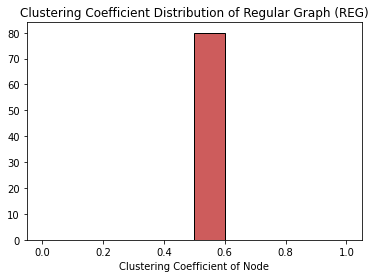

For  Random Graph - Erdos-Renyi (RG(ER)) : 
{0: 0.06666666666666667, 1: 0.06666666666666667, 2: 0, 3: 0.047619047619047616, 4: 0.08791208791208792, 5: 0.19047619047619047, 6: 0.14285714285714285, 7: 0.09523809523809523, 8: 0.07272727272727272, 9: 0.2, 10: 0.047619047619047616, 11: 0.2, 12: 0, 13: 0, 14: 0.09523809523809523, 15: 0.10714285714285714, 16: 0, 17: 0.1111111111111111, 18: 0.15555555555555556, 19: 0, 20: 0.09090909090909091, 21: 0.03571428571428571, 22: 0, 23: 0.11538461538461539, 24: 0, 25: 0.17777777777777778, 26: 0.13333333333333333, 27: 0.2, 28: 0, 29: 0, 30: 0.05555555555555555, 31: 0.14285714285714285, 32: 0.05555555555555555, 33: 0, 34: 0, 35: 0.1388888888888889, 36: 0.1388888888888889, 37: 0.08496732026143791, 38: 0.03571428571428571, 39: 0.17857142857142858, 40: 0.14285714285714285, 41: 0.2, 42: 0.06666666666666667, 43: 0.07142857142857142, 44: 0.08888888888888889, 45: 0.06666666666666667, 46: 0.06666666666666667, 47: 0.1111111111111111, 48: 0.027777777777777776, 49:

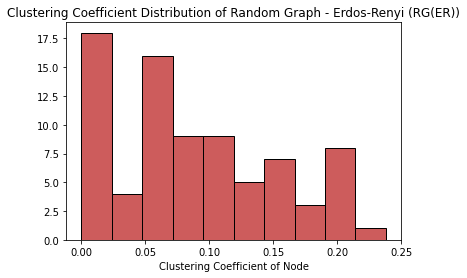

For  Random Geometric Graph (RGG) : 
{0: 0.6617647058823529, 1: 0.7523809523809524, 2: 0.7666666666666667, 3: 0.6666666666666666, 4: 0.5, 5: 0.7333333333333333, 6: 0.8363636363636363, 7: 0.5, 8: 0.6388888888888888, 9: 0.6923076923076923, 10: 0.8, 11: 0.6666666666666666, 12: 0.4666666666666667, 13: 0.9166666666666666, 14: 0.48717948717948717, 15: 0.6388888888888888, 16: 0.8888888888888888, 17: 0.5824175824175825, 18: 0.7032967032967034, 19: 0.9102564102564102, 20: 0.4666666666666667, 21: 0.6818181818181818, 22: 0.75, 23: 0.48484848484848486, 24: 0.5714285714285714, 25: 0.5904761904761905, 26: 0.5, 27: 0.5818181818181818, 28: 0.9, 29: 1.0, 30: 0.6666666666666666, 31: 0.9166666666666666, 32: 0.5303030303030303, 33: 1.0, 34: 0.7032967032967034, 35: 0.5294117647058824, 36: 0.8444444444444444, 37: 0.6, 38: 0.5897435897435898, 39: 0.7272727272727273, 40: 0.7132352941176471, 41: 0.9444444444444444, 42: 0.4888888888888889, 43: 0.7047619047619048, 44: 0.6363636363636364, 45: 0.8666666666666667, 

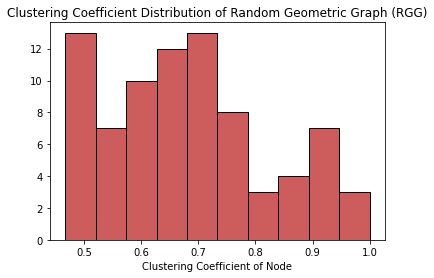

For  Scale Free (SF) : 
{0: 0.10897435897435898, 1: 0.14285714285714285, 2: 0.12535612535612536, 3: 0, 4: 0.23809523809523808, 5: 0.14285714285714285, 6: 0.20588235294117646, 7: 0.2545454545454545, 8: 0.19480519480519481, 9: 0.19696969696969696, 10: 0.25757575757575757, 11: 0.3111111111111111, 12: 0.39285714285714285, 13: 0.16666666666666666, 14: 0.16666666666666666, 15: 0.24444444444444444, 16: 0.21428571428571427, 17: 0.3, 18: 0.11538461538461539, 19: 0.8333333333333334, 20: 0.16363636363636364, 21: 0.25, 22: 0.05, 23: 0.19047619047619047, 24: 0.3, 25: 0.19047619047619047, 26: 0.25, 27: 0, 28: 0, 29: 0.3333333333333333, 30: 0.17857142857142858, 31: 0.26666666666666666, 32: 0.13333333333333333, 33: 0.4, 34: 0.2, 35: 0.19047619047619047, 36: 0.4, 37: 0.4, 38: 0.6666666666666666, 39: 0.06666666666666667, 40: 0, 41: 0.25, 42: 0.4, 43: 0.26666666666666666, 44: 0.26666666666666666, 45: 0.09523809523809523, 46: 0.17857142857142858, 47: 0.5, 48: 0.2, 49: 0.07142857142857142, 50: 0.1, 51: 0.1

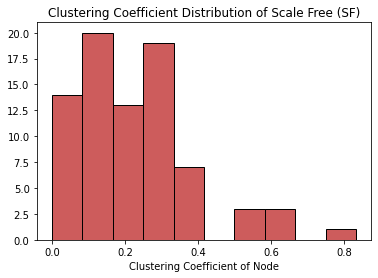

For  Small World (SW) : 
{0: 0, 1: 0.3333333333333333, 2: 0.3333333333333333, 3: 0.2, 4: 0.2, 5: 0.3333333333333333, 6: 0.16666666666666666, 7: 0, 8: 0, 9: 0, 10: 0, 11: 0, 12: 0, 13: 0, 14: 0, 15: 0, 16: 0, 17: 0.16666666666666666, 18: 0, 19: 0, 20: 0, 21: 0, 22: 0, 23: 0, 24: 0, 25: 0, 26: 0.3333333333333333, 27: 0.1, 28: 0.16666666666666666, 29: 0, 30: 0, 31: 0, 32: 0, 33: 0.3333333333333333, 34: 0.2, 35: 0.3333333333333333, 36: 0.2, 37: 0, 38: 0, 39: 0, 40: 0.16666666666666666, 41: 0.6666666666666666, 42: 0.3, 43: 0.2, 44: 0.3333333333333333, 45: 0.2, 46: 0.2, 47: 0.3, 48: 0.5, 49: 0.13333333333333333, 50: 0.16666666666666666, 51: 0.16666666666666666, 52: 0.3333333333333333, 53: 0.3, 54: 0.5, 55: 0.3, 56: 0.3333333333333333, 57: 0.16666666666666666, 58: 0, 59: 0, 60: 0, 61: 0.3333333333333333, 62: 0.2, 63: 0.5, 64: 0.3333333333333333, 65: 0.2, 66: 0.3333333333333333, 67: 0.3333333333333333, 68: 0.06666666666666667, 69: 0.3333333333333333, 70: 0.1, 71: 0.16666666666666666, 72: 0.166

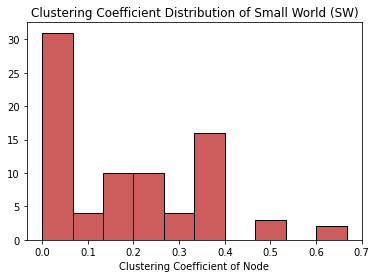

For  American College Football : 
{'BrighamYoung': 0.3484848484848485, 'FloridaState': 0.4393939393939394, 'Iowa': 0.3787878787878788, 'KansasState': 0.3333333333333333, 'NewMexico': 0.41818181818181815, 'TexasTech': 0.36363636363636365, 'PennState': 0.3181818181818182, 'SouthernCalifornia': 0.3939393939393939, 'ArizonaState': 0.4727272727272727, 'SanDiegoState': 0.4727272727272727, 'Baylor': 0.4444444444444444, 'NorthTexas': 0.3111111111111111, 'NorthernIllinois': 0.3333333333333333, 'Northwestern': 0.38181818181818183, 'WesternMichigan': 0.37777777777777777, 'Wisconsin': 0.3484848484848485, 'Wyoming': 0.41818181818181815, 'Auburn': 0.34545454545454546, 'Akron': 0.4, 'VirginiaTech': 0.43636363636363634, 'Alabama': 0.36363636363636365, 'UCLA': 0.45454545454545453, 'Arizona': 0.509090909090909, 'Utah': 0.45454545454545453, 'ArkansasState': 0.2222222222222222, 'NorthCarolinaState': 0.509090909090909, 'BallState': 0.3333333333333333, 'Florida': 0.36363636363636365, 'BoiseState': 0.3333333

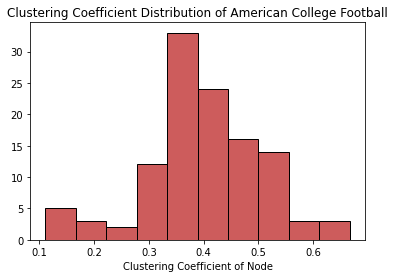

For  Game of Thrones - season 5 : 
{'ARYA': 0.2727272727272727, 'JAQEN': 0.8, 'JORAH': 0.4909090909090909, 'TYRION': 0.23976608187134502, 'BRONN': 0.3939393939393939, 'JAIME': 0.3235294117647059, 'VARYS': 0.47619047619047616, 'DAENERYS': 0.4065934065934066, 'CERSEI': 0.1724137931034483, 'HIGH_SPARROW': 0.36363636363636365, 'BRIENNE': 0.39285714285714285, 'PODRICK': 0.5333333333333333, 'JON': 0.22, 'STANNIS': 0.2572463768115942, 'LITTLEFINGER': 0.18333333333333332, 'SANSA': 0.20952380952380953, 'SAM': 0.30526315789473685, 'GILLY': 0.5606060606060606, 'DAARIO': 0.6666666666666666, 'MARGAERY': 0.6785714285714286, 'TOMMEN': 0.3787878787878788, 'THEON': 0.4888888888888889, 'HIZDAHR': 0.6, 'DAVOS': 0.7777777777777778, 'TORMUND': 0.4642857142857143, 'MYRCELLA': 0.7857142857142857, 'MYRANDA': 1.0, 'RAMSAY': 0.6428571428571429, 'MELISANDRE': 0.7333333333333333, 'ROOSE_BOLTON': 0.4, 'WAIF': 1.0, 'SHIREEN': 0.9523809523809523, 'QYBURN': 0.6666666666666666, 'OLLY': 0.8, 'BARRISTAN': 0.476190476190

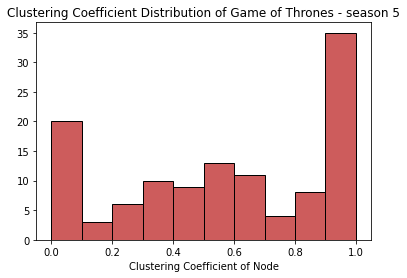

For  email-Eu-core : 
{'0': 0.2764227642276423, '1': 0.2653061224489796, '2': 0.2978027115474521, '3': 0.38491048593350385, '4': 0.31869137497140243, '5': 0.10700197238658778, '6': 0.15518331226295828, '7': 0.28778467908902694, '8': 0.4470588235294118, '9': 0.42532005689900426, '10': 0.3154486586493987, '11': 0.22917437985931136, '12': 0.3025974025974026, '13': 0.11089951120421507, '14': 0.21578421578421578, '15': 0.3526530612244898, '16': 0.28470936690114773, '17': 0.28593272171253825, '18': 0.30118798043326345, '19': 0.28322981366459626, '20': 0.28482003129890454, '21': 0.24803921568627452, '22': 0.38461538461538464, '23': 0.3427458617332035, '24': 0.38549075391180654, '25': 0.48295454545454547, '26': 0.5208333333333334, '27': 0.36885245901639346, '28': 0.34475537787930705, '29': 0.3935064935064935, '30': 0.4027972027972028, '31': 0.4122340425531915, '32': 0.5473484848484849, '33': 0.5793650793650794, '34': 0.6379310344827587, '35': 0.41228070175438597, '36': 0.46511627906976744, '37

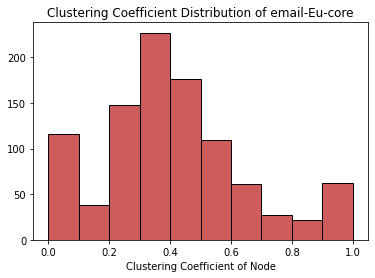

In [11]:
for i in range(0, len(graph)):
  print("For ", graph_name[i],  ": ")
  cc = dict(nx.clustering(graph[i]))
  print(cc)
  print("The mean clustering coefficient of all nodes is: ", np.mean(list(cc.values())),'\n')
  plt.title("Clustering Coefficient Distribution of " + str(graph_name[i]))
  plt.xlabel("Clustering Coefficient of Node")
  plt.hist(list(cc.values()), edgecolor = 'black', color = 'indianred')
  plt.show()

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Η μέση τιμή του American College Football είναι πιο κοντά στον REG γράφο, παρόλο που οι κατανομές τους προφανώς δεν μοιάζουν. Το ίδιο ισχύει και για το email-EU-core, του οποίου η κατανομή μοιάζει με του SF ή του RG(ER) (είναι και οι 2 heavy-tailed). Η μέση τιμή του GoT season 5 είναι ανάμεσα στον REG και τους RG(ER) και RGG και φυσικά η κατανομή του είναι πιο κοντά στου RGG, αλλά μοιάζει και με τους RG(ER) και SW.

<h4>Μελέτη κεντρικότητας εγγύτητας για πραγματικές και συνθετικές τοπολογίες </h4>

For  Regular Graph (REG) : 
{0: 0.09634146341463415, 1: 0.09634146341463415, 2: 0.09634146341463415, 3: 0.09634146341463415, 4: 0.09634146341463415, 5: 0.09634146341463415, 6: 0.09634146341463415, 7: 0.09634146341463415, 8: 0.09634146341463415, 9: 0.09634146341463415, 10: 0.09634146341463415, 11: 0.09634146341463415, 12: 0.09634146341463415, 13: 0.09634146341463415, 14: 0.09634146341463415, 15: 0.09634146341463415, 16: 0.09634146341463415, 17: 0.09634146341463415, 18: 0.09634146341463415, 19: 0.09634146341463415, 20: 0.09634146341463415, 21: 0.09634146341463415, 22: 0.09634146341463415, 23: 0.09634146341463415, 24: 0.09634146341463415, 25: 0.09634146341463415, 26: 0.09634146341463415, 27: 0.09634146341463415, 28: 0.09634146341463415, 29: 0.09634146341463415, 30: 0.09634146341463415, 31: 0.09634146341463415, 32: 0.09634146341463415, 33: 0.09634146341463415, 34: 0.09634146341463415, 35: 0.09634146341463415, 36: 0.09634146341463415, 37: 0.09634146341463415, 38: 0.09634146341463415, 39: 0.

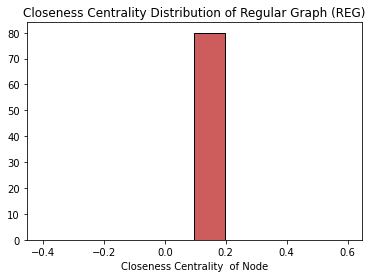

For  Random Graph - Erdos-Renyi (RG(ER)) : 
{0: 0.4030612244897959, 1: 0.4030612244897959, 2: 0.4072164948453608, 3: 0.42245989304812837, 4: 0.512987012987013, 5: 0.42021276595744683, 6: 0.43169398907103823, 7: 0.42473118279569894, 8: 0.45930232558139533, 9: 0.3910891089108911, 10: 0.4340659340659341, 11: 0.3691588785046729, 12: 0.3761904761904762, 13: 0.3853658536585366, 14: 0.41798941798941797, 15: 0.41798941798941797, 16: 0.395, 17: 0.47023809523809523, 18: 0.441340782122905, 19: 0.44886363636363635, 20: 0.4619883040935672, 21: 0.42021276595744683, 22: 0.41361256544502617, 23: 0.4759036144578313, 24: 0.3574660633484163, 25: 0.47305389221556887, 26: 0.4030612244897959, 27: 0.395, 28: 0.4072164948453608, 29: 0.3172690763052209, 30: 0.4388888888888889, 31: 0.4114583333333333, 32: 0.4388888888888889, 33: 0.4072164948453608, 34: 0.3798076923076923, 35: 0.4619883040935672, 36: 0.45930232558139533, 37: 0.5302013422818792, 38: 0.42702702702702705, 39: 0.4463276836158192, 40: 0.4540229885057

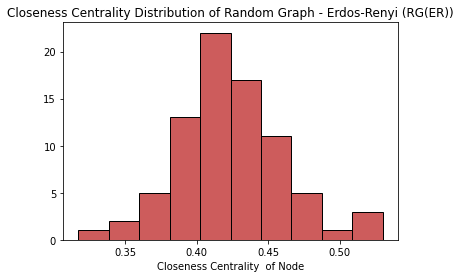

For  Random Geometric Graph (RGG) : 
{0: 0.37799043062200954, 1: 0.32510288065843623, 2: 0.32644628099173556, 3: 0.28113879003558717, 4: 0.2791519434628975, 5: 0.2344213649851632, 6: 0.3319327731092437, 7: 0.43169398907103823, 8: 0.2801418439716312, 9: 0.32644628099173556, 10: 0.2633333333333333, 11: 0.26421404682274247, 12: 0.30859375, 13: 0.2831541218637993, 14: 0.305019305019305, 15: 0.27147766323024053, 16: 0.305019305019305, 17: 0.4030612244897959, 18: 0.30980392156862746, 19: 0.30859375, 20: 0.2705479452054795, 21: 0.3237704918032787, 22: 0.2651006711409396, 23: 0.398989898989899, 24: 0.29259259259259257, 25: 0.33760683760683763, 26: 0.3110236220472441, 27: 0.3969849246231156, 28: 0.24842767295597484, 29: 0.21066666666666667, 30: 0.33617021276595743, 31: 0.2831541218637993, 32: 0.4114583333333333, 33: 0.22636103151862463, 34: 0.30980392156862746, 35: 0.3574660633484163, 36: 0.2633333333333333, 37: 0.3674418604651163, 38: 0.395, 39: 0.3224489795918367, 40: 0.3278008298755187, 41: 

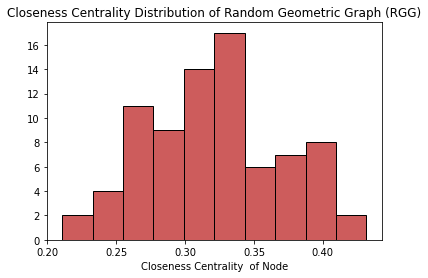

For  Scale Free (SF) : 
{0: 0.6638655462184874, 1: 0.47305389221556887, 2: 0.5895522388059702, 3: 0.4010152284263959, 4: 0.5374149659863946, 5: 0.5683453237410072, 6: 0.541095890410959, 7: 0.512987012987013, 8: 0.572463768115942, 9: 0.5096774193548387, 10: 0.512987012987013, 11: 0.47023809523809523, 12: 0.4876543209876543, 13: 0.46745562130177515, 14: 0.5064102564102564, 15: 0.48466257668711654, 16: 0.4647058823529412, 17: 0.441340782122905, 18: 0.5031847133757962, 19: 0.45664739884393063, 20: 0.4759036144578313, 21: 0.5064102564102564, 22: 0.47878787878787876, 23: 0.441340782122905, 24: 0.4340659340659341, 25: 0.43646408839779005, 26: 0.45664739884393063, 27: 0.42473118279569894, 28: 0.395, 29: 0.44886363636363635, 30: 0.42473118279569894, 31: 0.42702702702702705, 32: 0.4438202247191011, 33: 0.47023809523809523, 34: 0.441340782122905, 35: 0.4388888888888889, 36: 0.4388888888888889, 37: 0.43169398907103823, 38: 0.4114583333333333, 39: 0.41361256544502617, 40: 0.40932642487046633, 41: 0

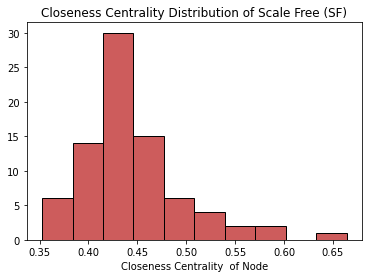

For  Small World (SW) : 
{0: 0.26245847176079734, 1: 0.24012158054711247, 2: 0.2523961661341853, 3: 0.25901639344262295, 4: 0.27526132404181186, 5: 0.24921135646687698, 6: 0.2762237762237762, 7: 0.2476489028213166, 8: 0.2705479452054795, 9: 0.25901639344262295, 10: 0.29259259259259257, 11: 0.2872727272727273, 12: 0.2801418439716312, 13: 0.2687074829931973, 14: 0.25483870967741934, 15: 0.2581699346405229, 16: 0.246875, 17: 0.2507936507936508, 18: 0.25, 19: 0.2581699346405229, 20: 0.2762237762237762, 21: 0.27147766323024053, 22: 0.2677966101694915, 23: 0.3147410358565737, 24: 0.30268199233716475, 25: 0.2981132075471698, 26: 0.27335640138408307, 27: 0.28214285714285714, 28: 0.2668918918918919, 29: 0.26245847176079734, 30: 0.2523961661341853, 31: 0.2841726618705036, 32: 0.2598684210526316, 33: 0.25732899022801303, 34: 0.2771929824561403, 35: 0.27335640138408307, 36: 0.2831541218637993, 37: 0.27335640138408307, 38: 0.24458204334365324, 39: 0.25732899022801303, 40: 0.2476489028213166, 41: 0.

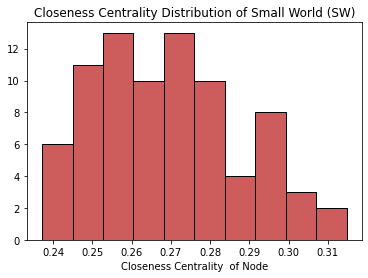

For  American College Football : 
{'BrighamYoung': 0.42379182156133827, 'FloridaState': 0.41304347826086957, 'Iowa': 0.40714285714285714, 'KansasState': 0.42066420664206644, 'NewMexico': 0.4028268551236749, 'TexasTech': 0.3838383838383838, 'PennState': 0.4253731343283582, 'SouthernCalifornia': 0.4014084507042254, 'ArizonaState': 0.36075949367088606, 'SanDiegoState': 0.397212543554007, 'Baylor': 0.38127090301003347, 'NorthTexas': 0.4028268551236749, 'NorthernIllinois': 0.3904109589041096, 'Northwestern': 0.42066420664206644, 'WesternMichigan': 0.38513513513513514, 'Wisconsin': 0.42379182156133827, 'Wyoming': 0.42379182156133827, 'Auburn': 0.41155234657039713, 'Akron': 0.38, 'VirginiaTech': 0.3904109589041096, 'Alabama': 0.4028268551236749, 'UCLA': 0.397212543554007, 'Arizona': 0.36774193548387096, 'Utah': 0.38513513513513514, 'ArkansasState': 0.42379182156133827, 'NorthCarolinaState': 0.41304347826086957, 'BallState': 0.3986013986013986, 'Florida': 0.3825503355704698, 'BoiseState': 0.40

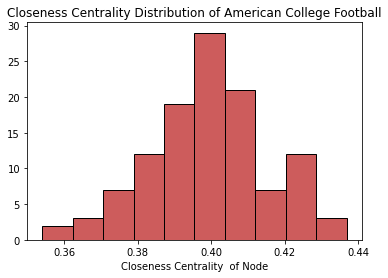

For  Game of Thrones - season 5 : 
{'ARYA': 0.3352272727272727, 'JAQEN': 0.2822966507177033, 'JORAH': 0.3400576368876081, 'TYRION': 0.3881578947368421, 'BRONN': 0.3352272727272727, 'JAIME': 0.40273037542662116, 'VARYS': 0.3746031746031746, 'DAENERYS': 0.3342776203966006, 'CERSEI': 0.4591439688715953, 'HIGH_SPARROW': 0.3653250773993808, 'BRIENNE': 0.39730639730639733, 'PODRICK': 0.4068965517241379, 'JON': 0.37942122186495175, 'STANNIS': 0.4521072796934866, 'LITTLEFINGER': 0.4555984555984556, 'SANSA': 0.44528301886792454, 'SAM': 0.34911242603550297, 'GILLY': 0.3400576368876081, 'DAARIO': 0.29064039408866993, 'MARGAERY': 0.3522388059701492, 'TOMMEN': 0.38436482084690554, 'THEON': 0.3522388059701492, 'HIZDAHR': 0.29064039408866993, 'DAVOS': 0.33618233618233617, 'TORMUND': 0.33146067415730335, 'MYRCELLA': 0.33053221288515405, 'MYRANDA': 0.3430232558139535, 'RAMSAY': 0.3746031746031746, 'MELISANDRE': 0.3342776203966006, 'ROOSE_BOLTON': 0.4354243542435424, 'WAIF': 0.25267665952890794, 'SHIREE

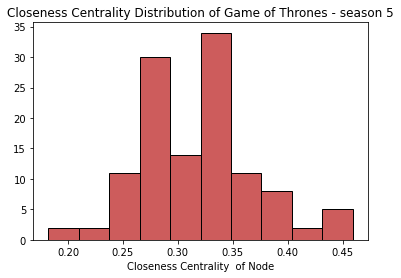

For  email-Eu-core : 
{'0': 0.43013100436681223, '1': 0.430506993006993, '2': 0.47039159503342887, '3': 0.45018281535648996, '4': 0.47106647537063606, '5': 0.5111572392319668, '6': 0.48498276710979815, '7': 0.4282608695652174, '8': 0.42112013681060284, '9': 0.3630667158127534, '10': 0.451007326007326, '11': 0.4395359214636323, '12': 0.44150605109816227, '13': 0.5127537740760021, '14': 0.4505946935041171, '15': 0.43816725978647686, '16': 0.466824644549763, '17': 0.478852698104035, '18': 0.4505946935041171, '19': 0.4499771585198721, '20': 0.460710944808232, '21': 0.497223624432105, '22': 0.38657770800627944, '23': 0.4600653900046707, '24': 0.40585084466419447, '25': 0.42184154175588867, '26': 0.3888669561784445, '27': 0.4385574354407836, '28': 0.4763056092843327, '29': 0.4499771585198721, '30': 0.4518348623853211, '31': 0.42622241453916054, '32': 0.3949478748997594, '33': 0.4010586319218241, '34': 0.389944576405384, '35': 0.45038866026520347, '36': 0.44091316025067145, '37': 0.3970173317

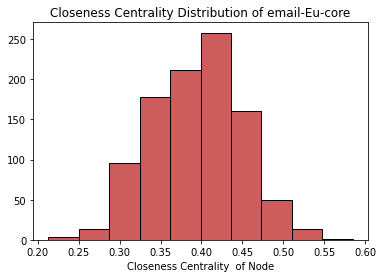

In [12]:
for i in range(0, len(graph)):
  print("For ", graph_name[i],  ": ")
  clce = dict(nx.closeness_centrality(graph[i]))
  print(clce)
  print("The mean closeness centrality  of all nodes is: ", np.mean(list(clce.values())),'\n')
  plt.title("Closeness Centrality Distribution of " + str(graph_name[i]))
  plt.xlabel("Closeness Centrality  of Node")
  plt.hist(list(clce.values()), edgecolor = 'black', color = 'indianred')
  plt.show()

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Και τα 3 πραγματικά δίκτυα έχουν παρόμοια μέση τιμή κεντρικότητας εγκύτητας με την RGG τοπολογία. Στο American College Footbal, η κενρικότητα εγκύτητας έχει αρκετά παρόμοια κατανομή με αυτή στα RG(ER) και RGG, στο GoT season 5 παρουσιάζει ομοιότητες με την κατανομή στο SW ή ακόμα και στο RGG και τέλος, στο email-EU-core θα λέγαμε ότι μοίαζει κάπως καλύτερα με την κατανομή στα RG(ER) και RGG, αλλά και στο SF

### **Τελικός σχολιασμός:**
Το American College Football θα το αντιστοιχίσουμε με το RG(ER) ή και SW δίκτυο με βάση το degree distribution και το clustering coefficient, και ως RG(ER) ή RGG , αν παρατηρούμε την ομοιότητα στις κατανομές κατά την αναπαράσταση των γράφων και καθώς έχουμε έντονη συγκέντρωση γύρω από υψηλές τιμές εγγύτητας και λίγους κόμβους με τιμές μεγαλύτερες και μικρότερες από αυτές.

Το GoT season 5 θα το αντιστοιχίσουμε με το RGG δίκτυο καθώς οι παραπάνω μετρικές έχουν περισσότερες ομοιότητες σε σχέση με τα υπόλοιπα δίκτυα, και οι κατανομές τους μοιάζουν σημαντικά.

Το email-EU-core θα το αντιστοιχίσουμε με το SF(ή και SW) δίκτυο, καθώς η διαδικασία ανταλλαγής emails μπορεί να παρομοιαστεί με αυτά τα δύο δίκτυα (και με βάση την κατανομή του βαθμού κόμβων που είναι power-law distribution και κατανομές και των άλλων 2 μετρικών μοιάζουν με αυτές στο SF ως ένα βαθμό)

<h3>B. Εξοικείωση με τα εργαλεία εντοπισμού κοινοτήτων</h3>
<ol>
<li>Χρησιμοποιώντας τις συναρτήσεις του <b>πίνακα 2</b> για κάθε <u>πραγματικό</u> (<b>πίνακας 1</b>) και <u>συνθετικό</u> (από την <b>άσκηση 1</b>) δίκτυο:</p>
<ol>
    <li>να οπτικοποιηθούν οι κοινότητες που προκύπτουν από την κάθε μέθοδο,</li>
    <li>να γίνουν οι απαραίτητοι σχολιασμοί (π.χ: σύγκριση του αριθμού των κοινοτήτων που υπολογίζει ο κάθε αλγόριθμος).</li>
</ol>
<p>Για την οπτικοποίηση, να επισημανθεί διαφορετικά κάθε κοινότητα, π.χ. με διαφορετικό χρώμα.</p>
<p style=text-align:justify>Στην περίπτωση των συνθετικών δικτύων, να πραγματοποιηθούν συγκρίσεις και μεταξύ των διαφορετικών τύπων τοπολογιών. Για παράδειγμα, στην περίπτωση του τυχαίου γεωμετρικού γράφου, υπάρχει διαισθητικά μία κοινότητα γύρω από κάθε κόμβο που δημιουργείται με βάση τις αποστάσεις του τελευταίου από τους υπόλοιπους κόμβους του δικτύου. Στην περίπτωση των scale-free δικτύων, είναι πιθανό να σχηματίζονται κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό.</p>
<li>Για κάθε αλγόριθμο εντοπισμού κοινοτήτων και για κάθε τοπολογία αξιολογήστε την ποιότητα της διαμέρισης με τις μετρικές performance και modularity (<a style=text-decoration:none href='https://networkx.org/documentation/stable/reference/algorithms/community.html#module-networkx.algorithms.community.quality'>measuring_partitions</a>). Για την μετρική performance, θα χρησιμοποιήσετε την συνάρτηση partition_quality του networkx.</li>
<li>Για την μεγαλύτερη συνδεδεμένη συνιστώσα του email-Eu-core, να συγκρίνετε την ground-truth διαμέριση που δίνεται στο αρχείο Email-Eu-core-department-labels.txt με τις διαμερίσεις που προκύπτουν από τις εξεταζόμενες μεθόδους ως προς το πλήθος των παραγόμενων κοινοτήτων και ως προς τις μετρικές performance και modularity. </li>
<li>Για την παρακολούθηση του χρόνου εκτέλεσης της υλοποίησής σας, μπορείτε να χρησιμοποιήσετε τις βιωλιοθήκες <a style=text-decoration:none href='https://tqdm.github.io/'>tqdm</a> και <a style=text-decoration:none href='https://docs.python.org/3/library/time.html'>time</a> . Στο σχολιασμό σας να λάβετε υπόψη το trade-off της ποιότητας της διαμέρισης και του χρόνου εκτέλεσης των εξεταζόμενων αλγορίθμων. </li>
</ol>

<table style=float:left;width:70%>
    <caption>Πίνακας <b>2</b>: Συναρτήσεις εντοπισμού κοινοτήτων</caption>
    <tr>
        <th style=text-align:left> Μέθοδος εντοπισμού κοινοτήτων</th>
        <th style=text-align:left>Συνάρτηση</th>
    </tr>
    <tr>
        <td style=text-align:left>Spectral Clustering</td>
        <td style=text-align:left><a style=text-decoration:none href='http://scikit-learn.org/stable/modules/generated/sklearn.cluster.SpectralClustering.html'>SpectralClustering</a></td>
    </tr>
       <tr>
        <td style=text-align:left>Newman-Girvan</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.centrality.girvan_newman.html'>girvan_newman</a></td>
    </tr>
    <tr>
        <td style=text-align:left>Modularity Maximization</td>
        <td style=text-align:left><a style=text-decoration:none                               href='https://networkx.github.io/documentation/latest/reference/algorithms/generated/networkx.algorithms.community.modularity_max.greedy_modularity_communities.html'>greedy_modularity_communities</a></td>
    </tr>
</table>
    

<p style=text-align:justify>Προτού εφαρμόσετε τις συναρτήσεις εντοπισμού κοινοτήτων μελετήστε προσεκτικά την <b>είσοδο που απαιτούν καθώς και τη μορφή εξόδου που παράγουν.</b></p>

In [13]:
#Χρησιμοποιήστε την συνάρτηση conv2int για να μετατρέψετε τα labels των κόμβων στις πραγματικές τοπολογίες σε integers
def conv2int(G,start_value):
    nG = nx.convert_node_labels_to_integers(G,first_label=start_value)
    G_mapping=dict(enumerate(G.nodes,0))
    return nG,G_mapping
football_converted, football_map = conv2int(football, 0)
got_converted, got_map = conv2int(got, 0)
email_converted, email_map = conv2int(eu, 0)
graph[5] = football_converted
graph[6] = got_converted
graph[7] = email_converted

<h4> Ορισμός χρωμάτων για την οπτικοποίηση των κοινοτήτων.</h4>

In [14]:
#insert colors for nodes
from matplotlib import colors as mcolors
colors = list(dict(mcolors.BASE_COLORS, **mcolors.CSS4_COLORS).keys())
#βγαζω όσα χρωματα μοιαζουν με ασπρο, για να φαινονται οι κομβοι
colors.remove('antiquewhite')
colors.remove('beige')
colors.remove('aliceblue')
colors.remove('bisque')
colors.remove('cornflowerblue')
colors.remove('blanchedalmond')
colors.remove('floralwhite')
colors.remove('linen')
colors.remove('lavenderblush')
colors.remove('lavender')
colors.remove('ghostwhite')
colors.remove('azure')
colors.remove('ivory')
colors.remove('honeydew')
colors.remove('cornsilk')
colors.remove('mintcream')
colors.remove('whitesmoke')
colors.remove('snow')
colors.remove('seashell')
colors.remove('lightcyan')
#και το ασπρο, μαυρο
colors.remove('white')
colors.remove('black')

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Newman-Girvan.</h4>
<p>Παράξτε τις διαμερίσεις που προκύπτουν από την μέθοδο Newman-Girvan. Ελέγξτε τις διαμερίσεις που έχουν μέχρι και 50 κοινότητες.</p> 
<p> Επιλέξτε τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>


 
 For  Regular Graph (REG) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.7249999999999999 , για  8  κοινότητες
Η κατανομή του modularity score:


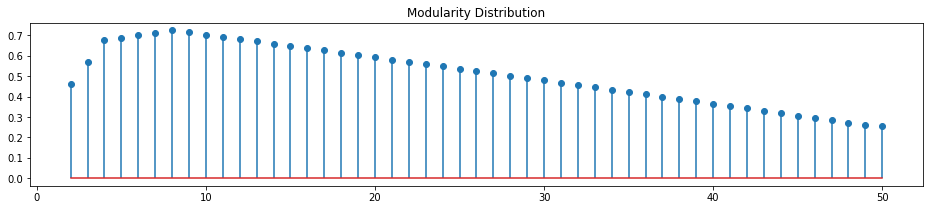

Το μεγαλύτερο performance score : 0.9696202531645569 , για  16  κοινότητες
Η κατανομή του performance score:


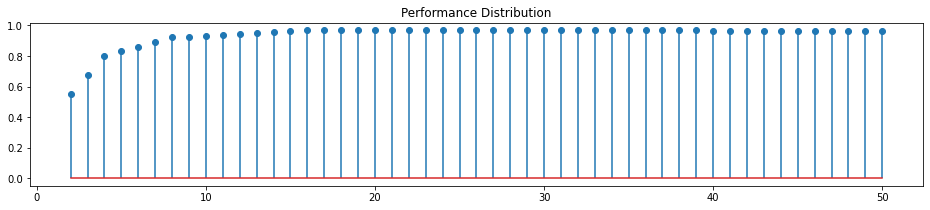

100%|██████████| 1/1 [00:01<00:00,  1.04s/it]



 
 For  Random Graph - Erdos-Renyi (RG(ER)) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.21109444444444445 , για  24  κοινότητες
Η κατανομή του modularity score:


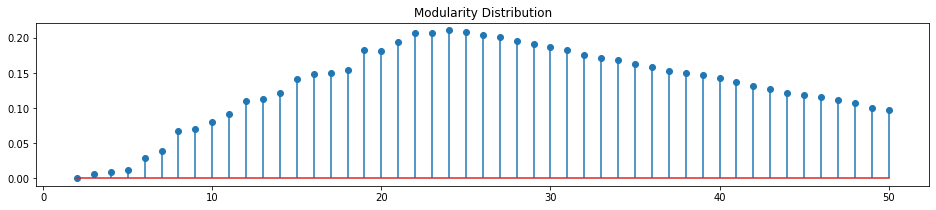

Το μεγαλύτερο performance score : 0.9215189873417722 , για  34  κοινότητες
Η κατανομή του performance score:


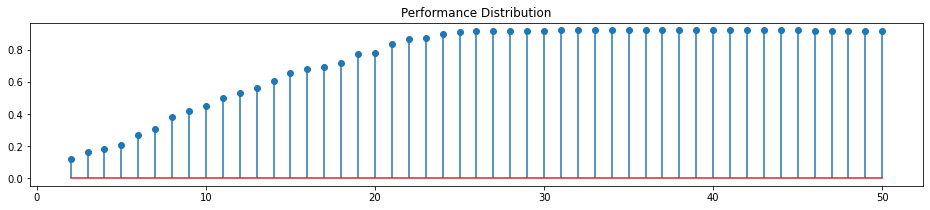

100%|██████████| 1/1 [00:03<00:00,  3.93s/it]



 
 For  Random Geometric Graph (RGG) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.5970493827160495 , για  5  κοινότητες
Η κατανομή του modularity score:


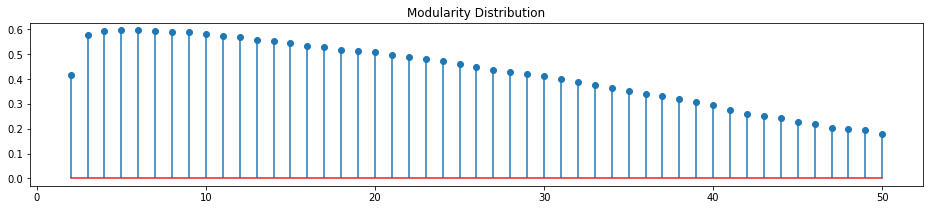

Το μεγαλύτερο performance score : 0.9291139240506329 , για  22  κοινότητες
Η κατανομή του performance score:


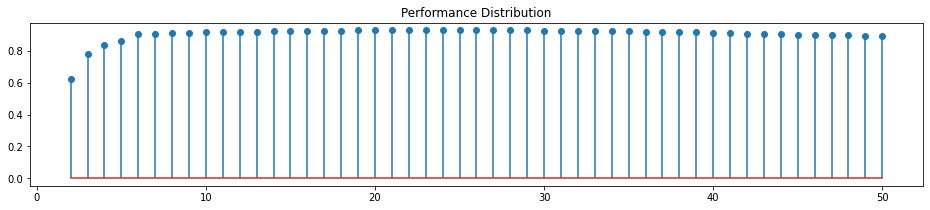

100%|██████████| 1/1 [00:03<00:00,  3.19s/it]



 
 For  Scale Free (SF) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.13638331024930742 , για  30  κοινότητες
Η κατανομή του modularity score:


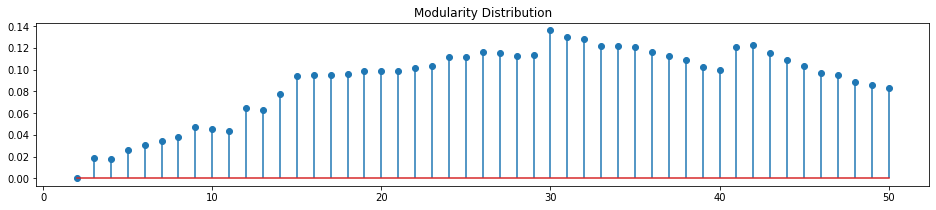

Το μεγαλύτερο performance score : 0.9174050632911392 , για  43  κοινότητες
Η κατανομή του performance score:


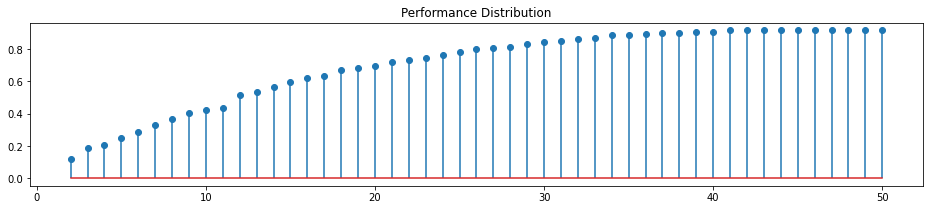

100%|██████████| 1/1 [00:04<00:00,  4.54s/it]



 
 For  Small World (SW) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.5741015625 , για  8  κοινότητες
Η κατανομή του modularity score:


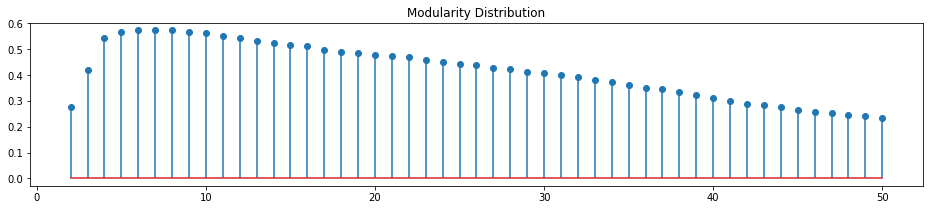

Το μεγαλύτερο performance score : 0.9670886075949368 , για  31  κοινότητες
Η κατανομή του performance score:


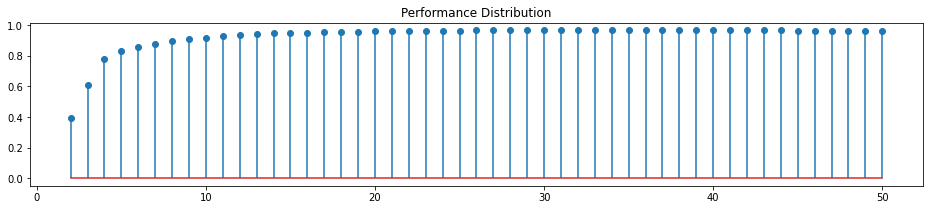

100%|██████████| 1/1 [00:01<00:00,  1.88s/it]



 
 For  American College Football : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.5996290274077957 , για  10  κοινότητες
Η κατανομή του modularity score:


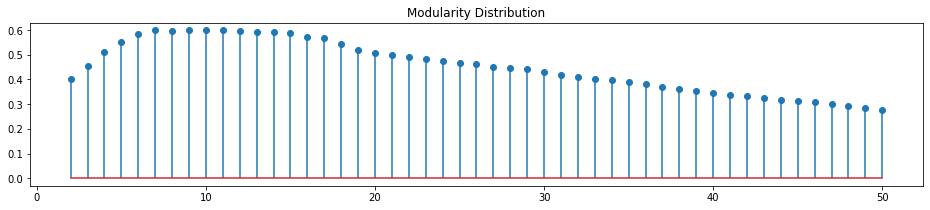

Το μεγαλύτερο performance score : 0.9581998474446987 , για  17  κοινότητες
Η κατανομή του performance score:


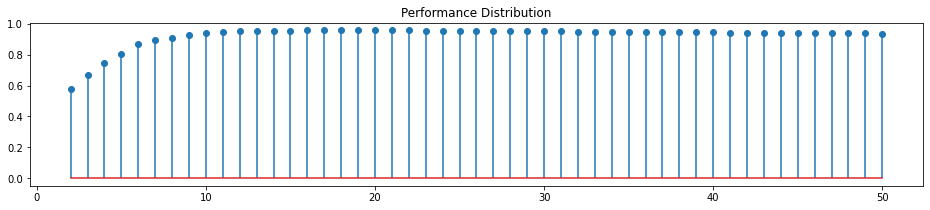

100%|██████████| 1/1 [00:11<00:00, 11.99s/it]



 
 For  Game of Thrones - season 5 : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.6681205999387817 , για  8  κοινότητες
Η κατανομή του modularity score:


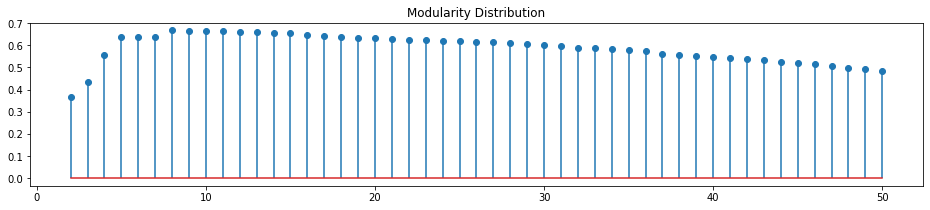

Το μεγαλύτερο performance score : 0.96425010682239 , για  50  κοινότητες
Η κατανομή του performance score:


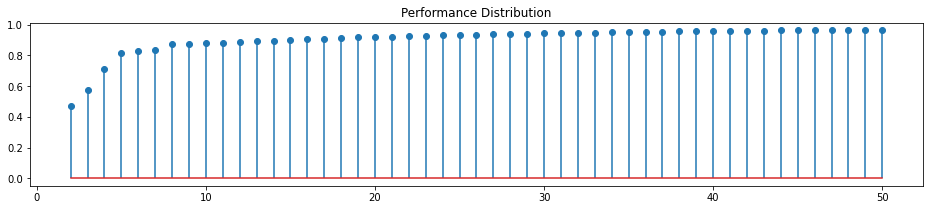

100%|██████████| 1/1 [00:05<00:00,  5.42s/it]



 
 For  email-Eu-core : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.0006218821799455388 , για  2  κοινότητες
Η κατανομή του modularity score:


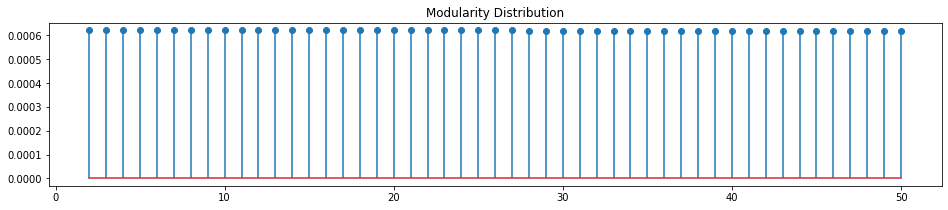

Το μεγαλύτερο performance score : 0.13940548388093205 , για  50  κοινότητες
Η κατανομή του performance score:


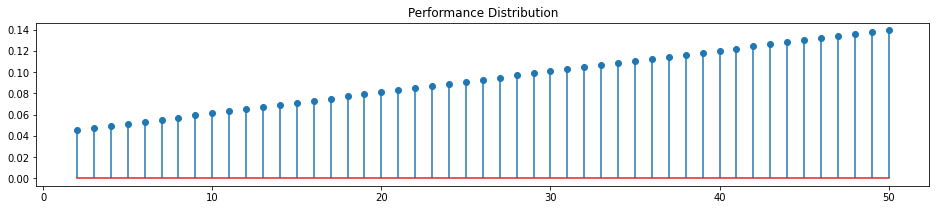

100%|██████████| 1/1 [14:36<00:00, 876.54s/it]


In [15]:
from networkx.drawing.layout import rescale_layout
import itertools  
from tqdm import tqdm
import time

def Newman_Girvan(G):
    modularity = []
    performance=[]
    res = nx.algorithms.community.centrality.girvan_newman(G)
    l = itertools.takewhile(lambda c: len(c) <= 50, res) #εχω εως 50 partitions
    limited = list(l)
    for communities in limited:
        #όλες οι κοινότητες για καθε τιμή από 2 εως 50 κοινότητες
        modularity.append(nx.community.quality.modularity(G, communities))
        performance.append(nx.community.quality.partition_quality(G, communities)[1])
    
    max_modularity = modularity.index(max(modularity)) + 2 #+2 επειδη ο min αριθμος κοινοτητων είναι 2, οχι το 0
    max_performance = performance.index(max(performance)) + 2
    
    #Για modularity
    print("Το μεγαλύτερο (μέγιστο / max) modularity score:", max(modularity), ", για ", max_modularity, " κοινότητες")

    print("Η κατανομή του modularity score:")
    plt.figure(figsize=(16, 3))
    plt.stem(range(2,51),modularity, use_line_collection = True)
    plt.title('Modularity Distribution')
    plt.show()
    plt.close()
    
    #Για performance
    print("Το μεγαλύτερο performance score :", max(performance), ", για ", max_performance, " κοινότητες")
    
    print("Η κατανομή του performance score:")
    plt.figure(figsize=(16, 3))
    plt.stem(range(2,51), performance, use_line_collection = True)
    plt.title('Performance Distribution')
    plt.show()
    
    return limited[max_modularity - 2], limited[max_performance - 2]

NewmanGirvinResults = []
for i in range(0, len(graph)):
  print("\n \n For ", graph_name[i],  ": ")
  for j in tqdm(range(1)):
    print('\n')
    NewmanGirvinResults.append(Newman_Girvan(graph[i]))
  

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΝΑΤΩΝ:**
Έχουμε στα περισσότερα δικτύα πολύ υψηλό performance score, πάνω από 0.9, εκτός από το eimail-EU (0,13). Tο max modularity που σημειώθηκε έχει τιμές γύρω στο το 0.2 -0,67, με πολύ χαμηλές τιμές στα δίκτυα SF, RG(ER) και email-EU-core, τα οποία παρουσιάζουν πολύ χαμηλή τιμή modularity (0.136, 2.11 και 0.0006218 αντίστοιχα). Αυτό πιθανότατα οφείλεται στο ότι η χρήση του edge betweeness centrality ως κριτήριο διαμέρησης (την οποία χρησιμοποιεί ο Newman-Girvan για την προοδευτική αφαίρεση ακμών από τον αρχικό γράφο) στα SF δικτύα, επιστρέφει communities με μικρό modularity. Όπως ξέρουμε, στα SF δίκτυα υπάρχουν πολλοί κόμβοι που έχουν ελάχιστες (πιθανά και μόνο 1) συνδέσεις. Ειδικά στην περίπτωση που έχουμε 1 μόνο ακμή, αυτή είναι λογικό να έχει μεγάλο betweeness centrality, αφού βρίσκεται σε όλα τα βέλτιστα μονοπάτια που ξεκινούν ή καταλήγουν στον κόμβο που συνδέει. Έτσι καταλήγουμε να θεωρούμε πιο εύκολα ως κοινότητα έναν μεμονωμένο κόμβο, γεγονός που αυξάνει το performance, αλλά μειώνει σημαντικά το modularity (ειδικά στα SF δίκτυα).

**Για τους χρόνους εκτέλεσης**: Γενικά οι χρόνοι εκτέλεσης για τα συνθετικά γραφήματα ήταν κάτω του 1sec (λόγω μικρού αριθμού κόμβων). Τα δίκτυα American College Football και GoT season 5 έτρεξαν και αυτα σε 13 και σε 4 δευτερόλεπτα αντίστοιχα, ήταν αναμενόμενο να χρειαστούν έναν μικρό αλλά μη αμεληταίο χρόνο. Στο email-Eu-core χρειαστήκαμε 14 λεπτά και 8 δευτερόλεπτα μέχρι να δούμε αποτέλεσμα, το οποίο είχε και πολύ χαμηλό σκορ (σχεδόν μηδενικό) και στις δύο μετρικές, αφού το email_Eu_core μοιάζει με SF δίκτυο. Ο λόγος που η μέθοδος αυτή είναι τόσο αργή είναι ότι σε κάθε επανάληψη πρέπει να υπολογίζονται εκ νέου το edge betweeness centrality.

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Spectral Clustering. </h4>
Προσοχή! Για την επιλογή της τιμής της παραμέτρου που αφορά στην διάσταση του projection subspace (n_clusters) της συνάρτησης SpectralClustering, θα πρέπει να λάβετε υπόψη το μέγεθος |V| του εκάστοτε δικτύου.
<p>Να εξετάσετε τις διαμερίσεις που προκύπτουν για n_clusters$=2,...,|V|$. Να επιλέξετε για οπτικοποίηση τις διαμερίσεις με το 1) μεγαλύτερο modularity score και 2) performance score για κάθε πραγματικό και συνθετικό δίκτυο.</p>


 
 For  Regular Graph (REG) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.7253125 , για  7  κοινότητες
Η κατανομή του modularity score:


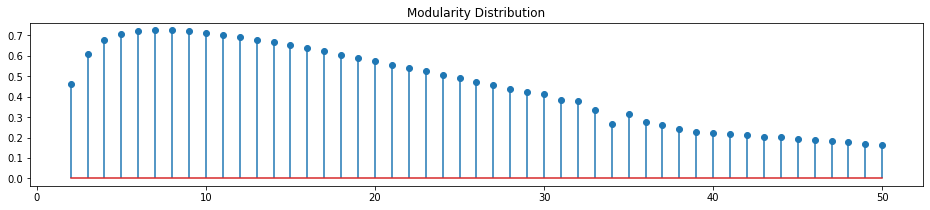

Το μεγαλύτερο performance score : 0.9743670886075949 , για  22  κοινότητες
Η κατανομή του performance score:


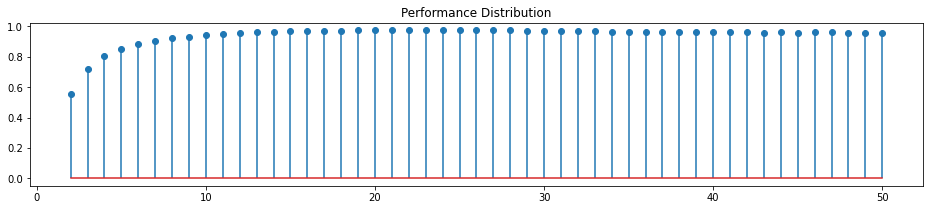

100%|██████████| 1/1 [00:04<00:00,  4.87s/it]



 
 For  Random Graph - Erdos-Renyi (RG(ER)) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.2781777777777778 , για  9  κοινότητες
Η κατανομή του modularity score:


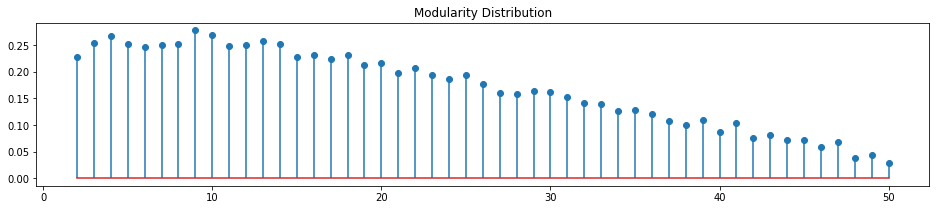

Το μεγαλύτερο performance score : 0.9151898734177215 , για  22  κοινότητες
Η κατανομή του performance score:


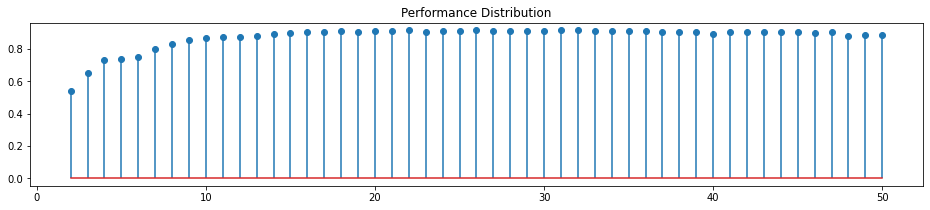

100%|██████████| 1/1 [00:04<00:00,  4.83s/it]



 
 For  Random Geometric Graph (RGG) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.6021827160493827 , για  6  κοινότητες
Η κατανομή του modularity score:


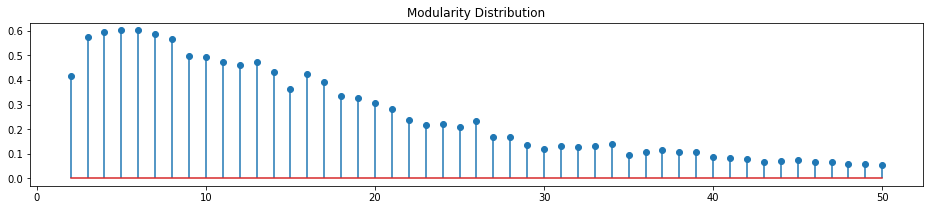

Το μεγαλύτερο performance score : 0.9367088607594937 , για  13  κοινότητες
Η κατανομή του performance score:


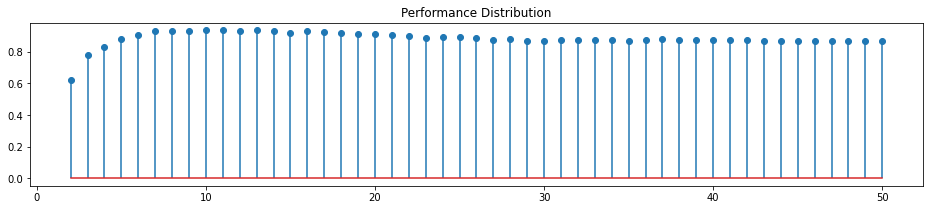

100%|██████████| 1/1 [00:05<00:00,  5.03s/it]



 
 For  Scale Free (SF) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.26802177112188363 , για  4  κοινότητες
Η κατανομή του modularity score:


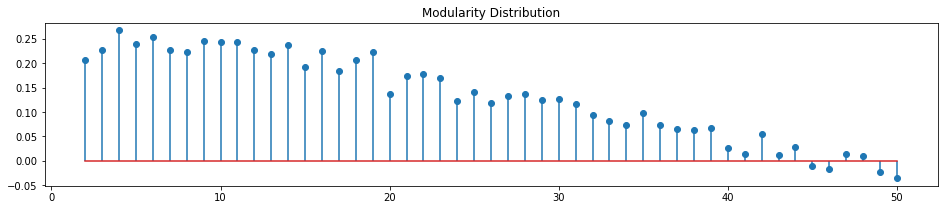

Το μεγαλύτερο performance score : 0.9145569620253164 , για  31  κοινότητες
Η κατανομή του performance score:


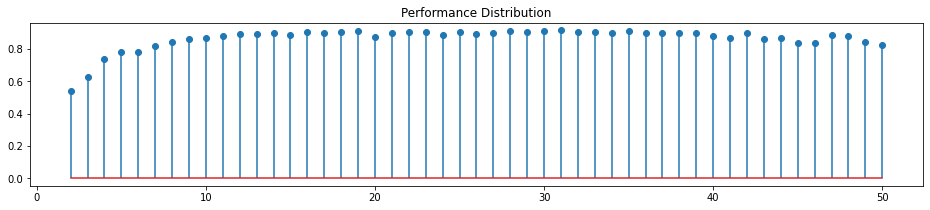

100%|██████████| 1/1 [00:05<00:00,  5.03s/it]



 
 For  Small World (SW) : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.55861328125 , για  9  κοινότητες
Η κατανομή του modularity score:


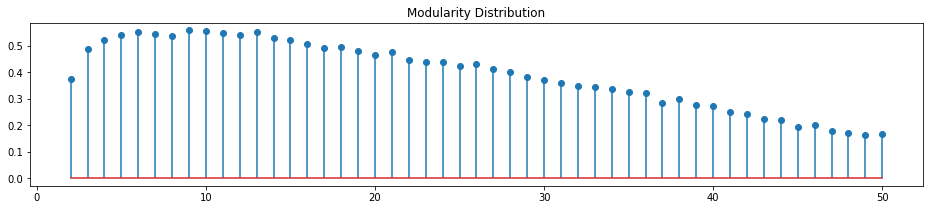

Το μεγαλύτερο performance score : 0.9674050632911393 , για  26  κοινότητες
Η κατανομή του performance score:


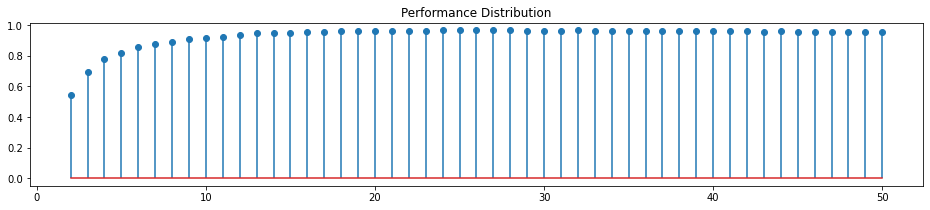

100%|██████████| 1/1 [00:04<00:00,  4.94s/it]



 
 For  American College Football : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.6022010863056824 , για  11  κοινότητες
Η κατανομή του modularity score:


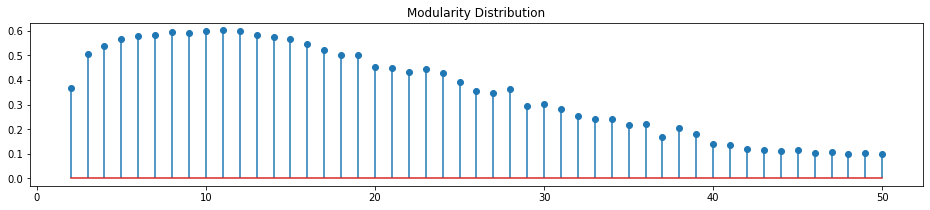

Το μεγαλύτερο performance score : 0.9581998474446987 , για  15  κοινότητες
Η κατανομή του performance score:


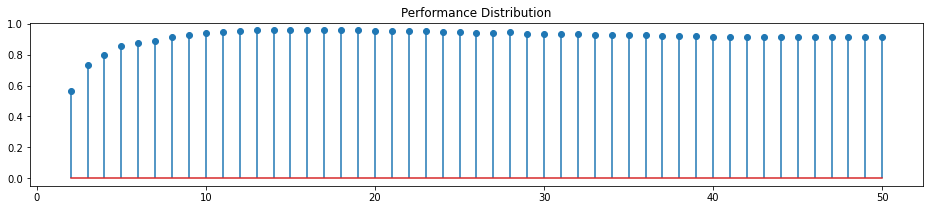

100%|██████████| 1/1 [00:06<00:00,  6.58s/it]



 
 For  Game of Thrones - season 5 : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.665416794204673 , για  7  κοινότητες
Η κατανομή του modularity score:


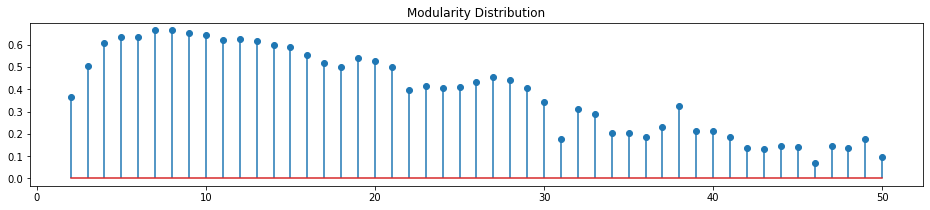

Το μεγαλύτερο performance score : 0.9534254379717989 , για  38  κοινότητες
Η κατανομή του performance score:


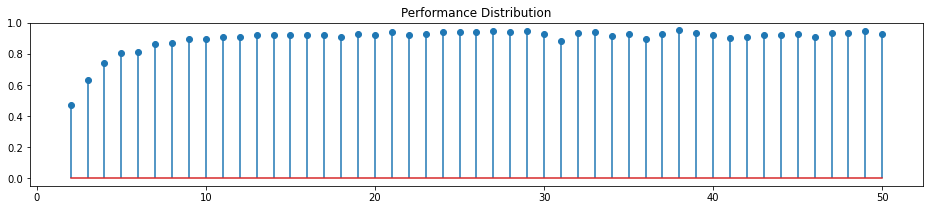

100%|██████████| 1/1 [00:07<00:00,  7.07s/it]



 
 For  email-Eu-core : 


  0%|          | 0/1 [00:00<?, ?it/s]



Το μεγαλύτερο (μέγιστο / max) modularity score: 0.382625032040042 , για  9  κοινότητες
Η κατανομή του modularity score:


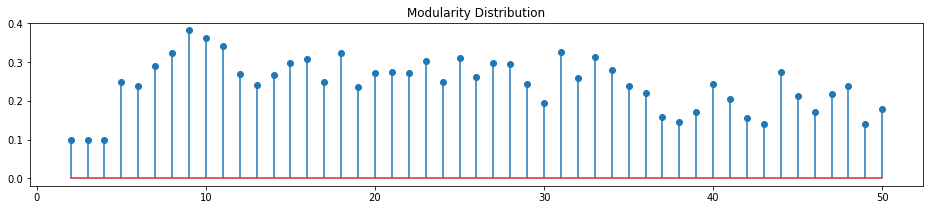

Το μεγαλύτερο performance score : 0.862857672388052 , για  31  κοινότητες
Η κατανομή του performance score:


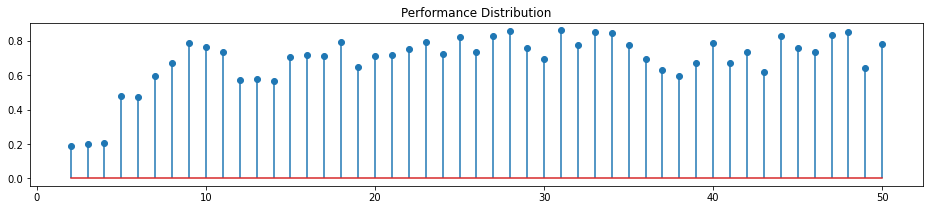

100%|██████████| 1/1 [00:53<00:00, 53.32s/it]


In [38]:
def Spectral_Clustering(G):
  modularity = []
  performance = []
  max_modularity = -100
  max_performance = 0
  best_mod=None
  best_per=None
  for i in range(2, 51):
      clustering = SpectralClustering(n_clusters=i, affinity='precomputed').fit(nx.adjacency_matrix(G))
      communities = []
      for j in range(0, i):
        communities.append(set(np.arange(len(clustering.labels_))[clustering.labels_==j]))
      modularity.append(nx.community.quality.modularity(G, communities))
      performance.append(nx.community.quality.partition_quality(G, communities)[1]) 
      if max_modularity < nx.community.quality.modularity(G, communities):
        max_modularity = nx.community.quality.modularity(G, communities)
        best_mod = communities
      arr = np.array(nx.community.quality.partition_quality(G, communities))
      if max_performance < arr[1]:
         max_performance = arr[1]
         best_per = communities
      
  max_modularity_index = modularity.index(max(modularity)) + 2
  max_performance_index = performance.index(max(performance)) + 2 
  
  #best_mod = SpectralClustering(n_clusters=np.argmax(modularity) + 2, affinity='precomputed', n_jobs=4).fit(nx.adjacency_matrix(G))
  best_mod_communities = tuple(best_mod)
  #best_per= SpectralClustering(n_clusters=np.argmax(performance) + 2, affinity='precomputed', n_jobs=4).fit(nx.adjacency_matrix(G))
  best_per_communities = tuple(best_per)
  
  
  #Για modularity
  print("Το μεγαλύτερο (μέγιστο / max) modularity score:", max(modularity), ", για ", max_modularity_index, " κοινότητες")

  print("Η κατανομή του modularity score:")
  plt.figure(figsize=(16, 3))
  plt.stem(range(2,51),modularity, use_line_collection = True)
  plt.title('Modularity Distribution')
  plt.show()
  plt.close()
  
  #Για performance
  print("Το μεγαλύτερο performance score :", max(performance), ", για ", max_performance_index, " κοινότητες")
  
  print("Η κατανομή του performance score:")
  plt.figure(figsize=(16, 3))
  plt.stem(range(2,51), performance, use_line_collection = True)
  plt.title('Performance Distribution')
  plt.show()
  
  return best_mod_communities, best_per_communities

SpectralClusteringResults = []
for i in range(0, len(graph)):
  print("\n \n For ", graph_name[i],  ": ")
  for j in tqdm(range(1)):
    print('\n')
    SpectralClusteringResults.append(Spectral_Clustering(graph[i]))

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Οι χρόνοι εκτέλεσης για κάποια από τα συνθετικά γραφήματα ήταν 4 δευτερόλεπτα. Τα δίκτυα American College Football και GoT season 5 έτρεξαν και σε 7 και σε 6 δευτερόλεπτα, χρόνος ελαφρώς μεγαλύτερος από αυτόν του Newman-Girvan. Το δίκτυο email-Eu-core αυτή τη φορά έτρεξε σε 53 δευτερόλεπτα, με αποτέλεσμα ο συνολικός χρόνος που χρειάστηκε για να βρεθούν οι κοινότητες σε όλα τα δίκτυα να είναι πάρα πολύ μικρότερος από τον συνολικό χρόνο εκτέλεσης για τον Newman-Girvan.
Οι τιμές των modularity και performance είναι αρκετά κοντά, αλλά αισθητά βελτιωμένες σε αυτές που είδαμε πριν. Όλοι σχεδόν οι γράφοι είχαν max performance πάνω από 90, ενώ πάλι οι τιμές του Modularity κυμαίνονταν από 0.25 έως 0.72 με τον μέσο όρο κάπου στο 0.5. Συμαντική διαφορά ωστόσο έχουμε στα αποτελέσματα των SF γράφων (δηλαδή του δικτύου SF και EU) αλλά και στον RG(ER). Οι τιμές των modularity σε αυτά είναι πολύ υψηλότερες από πριν (από 0.000622 σε 0.375 για το email-EU-core, από 0.211 σε 0.27 για τον RG(ER) και από 0,136 σε 0.268 για το SF). Με αυτά κατά νου, θα προτιμούσαμε συνολικά τον Spectral Clustering από τον Newman-Girvan, γιατί ενώ οι τιμές modularity και performance είναι παρόμοιες κατά μέσο όρο, ο πρώτος είναι πολύ γρηγορότερος και δεν φαίνεται να παρουσιάζει κάποια αδυναμία σε συγκεκριμένο τύπο γραφήματος (όπως ο Newman-Girvan στα SF δίκτυα).

<h4>Εντοπισμός κοινοτήτων σε συνθετικά και πραγματικά δίκτυα με τη μέθοδο Modularity Maximization.</h4>
Για την διαμέριση που θα προκύψει σε κάθε συνθετικό και πραγματικό δίκτυο, να υπολογίσετε το modularity score και το performance score.

In [17]:
def Modularity_Maximization(G):
  res = nx.algorithms.community.modularity_max.greedy_modularity_communities(G, weight = "weight")
  modularity = nx.algorithms.community.quality.modularity(G, res)
  performance = (nx.algorithms.community.quality.partition_quality(G, res)[1])

  print("'Εχουμε ", len(res), " κοινότητες. \n ")
  print("Modularity score: ", modularity, " \n")
  print("Performance score: ", performance)
  
  return res

ModMaxResults = []
for i in range(0, len(graph)):
  print("\n \n For ", graph_name[i],  ": ")
  for j in tqdm(range(1)):
    print('\n')
    ModMaxResults.append(Modularity_Maximization(graph[i]))




 
 For  Regular Graph (REG) : 


100%|██████████| 1/1 [00:00<00:00, 39.31it/s]




'Εχουμε  4  κοινότητες. 
 
Modularity score:  0.673125  

Performance score:  0.8006329113924051

 
 For  Random Graph - Erdos-Renyi (RG(ER)) : 


100%|██████████| 1/1 [00:00<00:00, 17.99it/s]




'Εχουμε  4  κοινότητες. 
 
Modularity score:  0.28364999999999996  

Performance score:  0.7591772151898735

 
 For  Random Geometric Graph (RGG) : 


100%|██████████| 1/1 [00:00<00:00, 28.59it/s]




'Εχουμε  4  κοινότητες. 
 
Modularity score:  0.5853728395061728  

Performance score:  0.8291139240506329

 
 For  Scale Free (SF) : 


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 17.04it/s]


'Εχουμε  5  κοινότητες. 
 
Modularity score:  0.27000194771468145  

Performance score:  0.7939873417721519

 
 For  Small World (SW) : 


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 34.91it/s]


'Εχουμε  8  κοινότητες. 
 
Modularity score:  0.563203125  

Performance score:  0.9003164556962026

 
 For  American College Football : 


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:00<00:00, 12.47it/s]


'Εχουμε  6  κοινότητες. 
 
Modularity score:  0.5497406651426807  

Performance score:  0.8681922196796339

 
 For  Game of Thrones - season 5 : 


  0%|          | 0/1 [00:00<?, ?it/s]



'Εχουμε 

100%|██████████| 1/1 [00:00<00:00, 17.47it/s]


 5  κοινότητες. 
 
Modularity score:  0.660477884909703  

Performance score:  0.829796325309785

 
 For  email-Eu-core : 


  0%|          | 0/1 [00:00<?, ?it/s]

100%|██████████| 1/1 [00:06<00:00,  6.49s/it]

'Εχουμε  8  κοινότητες. 
 
Modularity score:  0.3471325650460906  

Performance score:  0.7078716240565892


### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Η μέθοδος Modularity Maximization είναι προφανώς η γρηγορότερη από όλες τις 3 μεθόδους, αφού ακόμα και το δίκτυο email-Eu-core έτρεξε σε << 1 δευτερόλεπτα, με αποτέλεσμα η συνάρτηση tqdm αντί να εμφανίζει πόσα sec χρειάστηκε η μία εντολή (sec/it) να εμφανίζει πόσες τέτοιες εντολές προλαβαίνουν να εκτελεστούν σε 1 sec (it/sec). Η μετρική performance ωστόσο δίνει αποτέλεσμα από 0.7 εώς (οριακά) 0.9 και όχι σταθερά => 0.9 όπως είχαμε στις δύο προηγούμενες μεθόδους. Οι τιμές του modularity είναι πάλι από 0.25 έως 0.67 και φαίνονται γενικά πολύ κοντά σε αυτές του spectral clustering (ακόμα και λίγο βελτιωμένες στα RG(ER) και SF.

## **ΓΕΝΙΚΟ ΣΥΜΠΕΡΑΣΜΑ:**
Αν δίνουμε τη μεγαλύτερη βαρύτητα στην ταχύτητα με την οποία μπορούμε να υπολογίσουμε τις κοινότητες ή αν δεν μας ενδιαφέρει τόσο ως κριτήριο το Performance Score, τότε η μέθοδος Modularity Maximization είναι η προφανής επιλογή, ειδικά όταν πρόκειται για μεγάλα γραφήματα. Αν επιθυμούμε τα βέλτιστα αποτελέσματα, επιλέγουμε τη μέθοδο Spectral Clustering, που είναι πολύ πιο γρήγορη από τη Newman-Girvan, παράγει τα βέλτιστα performance scores και πολύ κόντα στα βέλτιστα modularity scores.


Παρατηρούμε επίσης πως οι τιμές της τοπολογίας GoT-season 5 μοιάζουν με τις τιμές της τοπολογίας RGG oι τιμές της τοπολογίας email-EU-core μοιάζουν με τις τιμές της τοπολογίας SF (επιβεβαιωνόμαστε για τα σχόλια στο 1).

In [18]:
def plot_communities(G, communities, name):
    communitiesList = []
    colorsList = []
    for i in range(len(communities)):
        color = colors[i % 156]
        for c in communities[i]:
            communitiesList.append(c)
            colorsList.append(color)
    plt.figure(1, figsize = (10,10))
    plt.title(name)
    node_position = nx.spring_layout(G)
    nx.draw_networkx_nodes(G, pos=node_position, nodelist=communitiesList, node_color=colorsList, node_size=80)
    nx.draw_networkx_edges(G, pos=node_position)
    plt.show()

#### Οπτικοποίηση κοινοτήτων American College Football

In [19]:
#print(NewmanGirvinResults)

In [20]:
#print(SpectralClusteringResults)

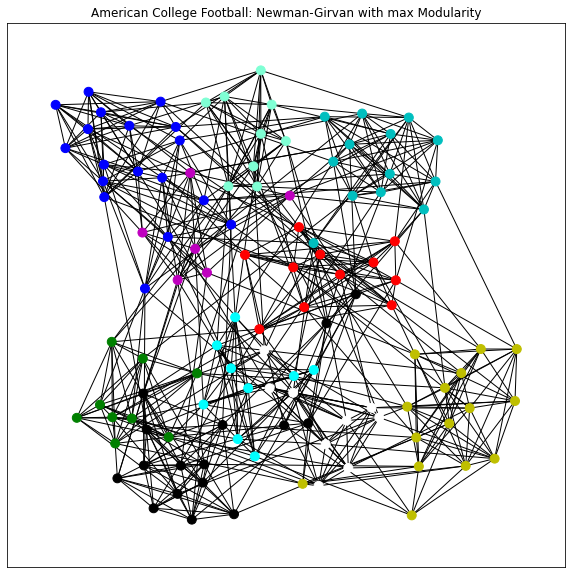

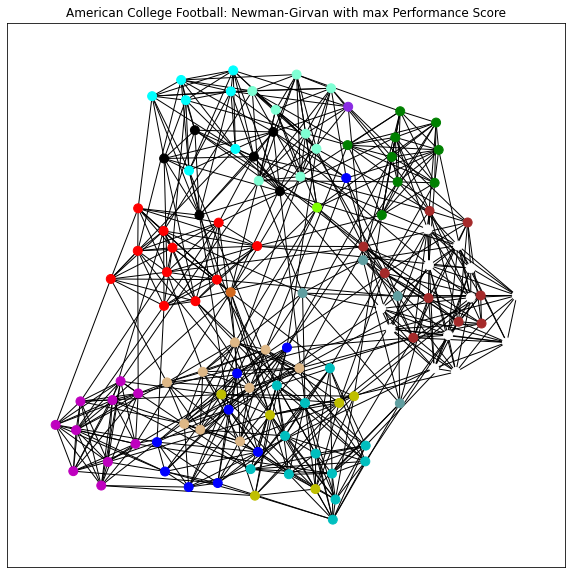

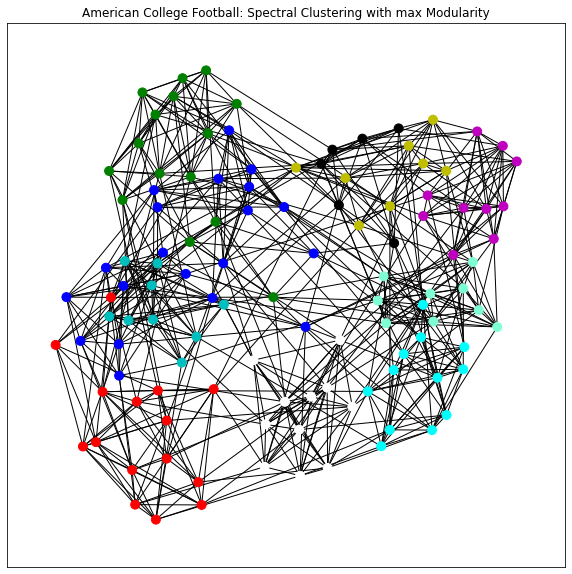

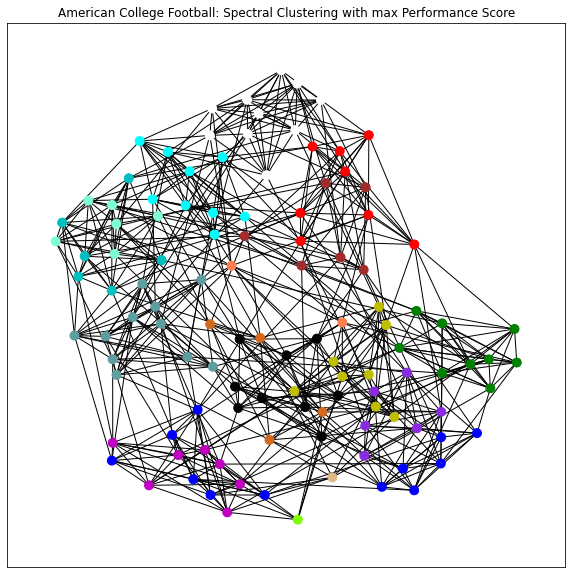

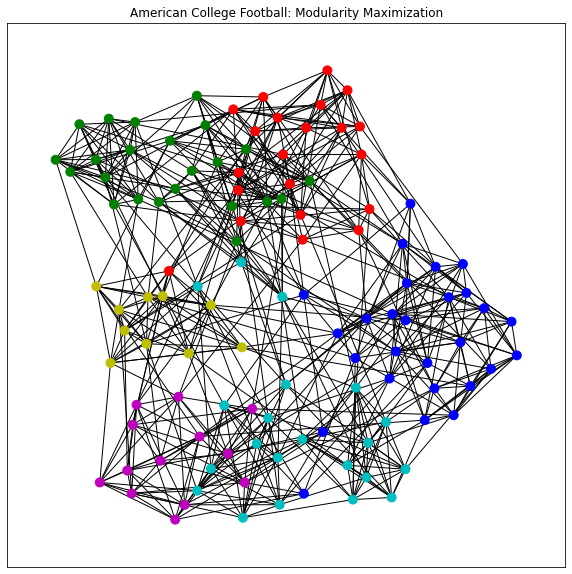

In [21]:
plot_communities(graph[5], NewmanGirvinResults[5][0], 'American College Football: Newman-Girvan with max Modularity')

plot_communities(graph[5], NewmanGirvinResults[5][1], 'American College Football: Newman-Girvan with max Performance Score')

plot_communities(graph[5], SpectralClusteringResults[5][0], 'American College Football: Spectral Clustering with max Modularity')

plot_communities(graph[5], SpectralClusteringResults[5][1], 'American College Football: Spectral Clustering with max Performance Score')

plot_communities(graph[5], ModMaxResults[5], 'American College Football: Modularity Maximization')

### **Σχολιασμός Αποτελεσμάτων:**
Οι κοινότητες δεν είναι ξεκάθαρα ορισμένες ωστόσο αποτελούνται από στενά συνδεδεμένους κόμβους που συνδέονται με λίγες ακμές με όλες σχεδόν τις άλλες κοινότητες, το οποίο είναι στοιχείο των SW δικτύων.
Το διάγραμμα γενικότερα εμφανίζει μεγάλη ομοιότητα με το αντίστοιχο διάγραμμα της τοπολογίας RG(ER), καθώς είναι (δείχνει) γενικά πυκνό και με τις κοινότητες να μην είναι εντελώς ξεκάθαρα ορισμένες.

#### Οπτικοποίηση κοινοτήτων Game of Thrones

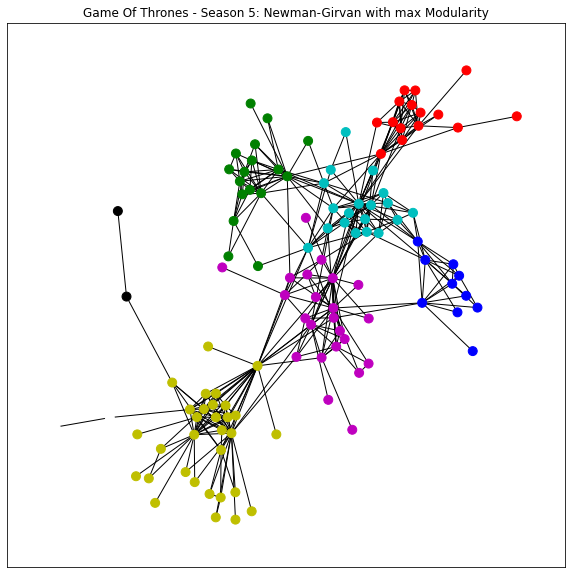

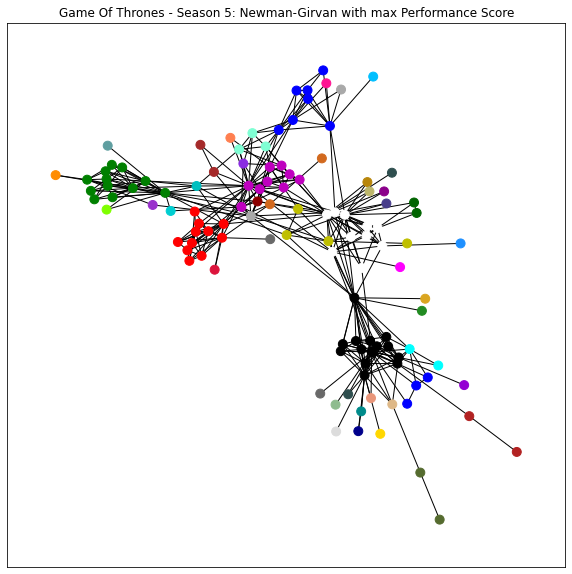

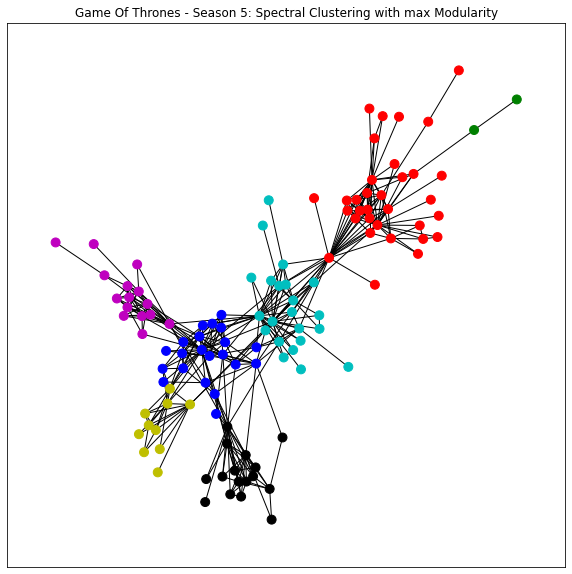

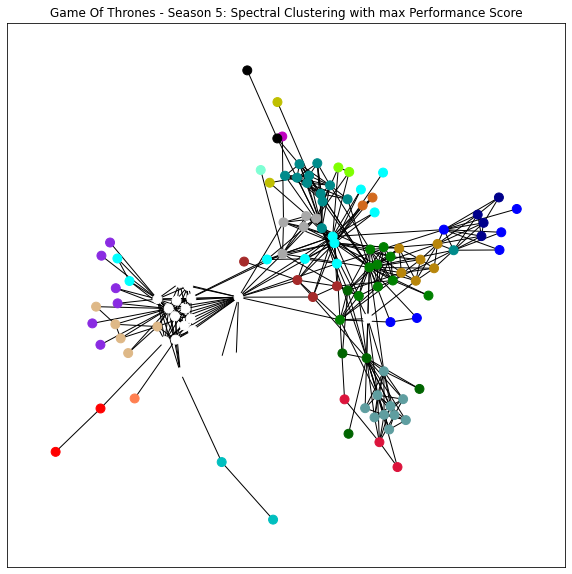

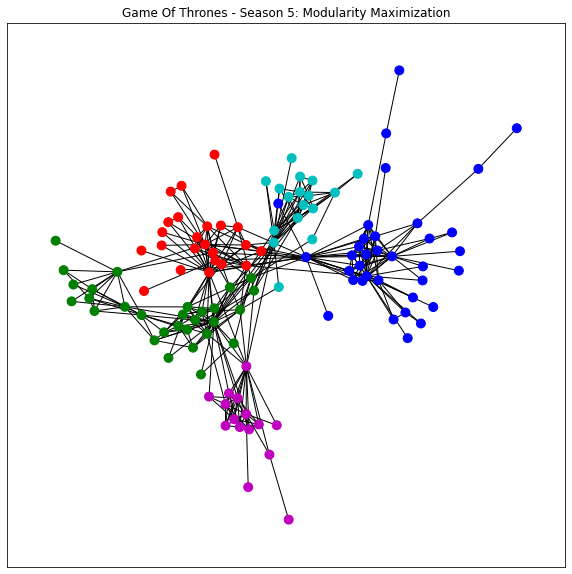

In [23]:
plot_communities(graph[6], NewmanGirvinResults[6][0], 'Game Of Thrones - Season 5: Newman-Girvan with max Modularity')

plot_communities(graph[6], NewmanGirvinResults[6][1], 'Game Of Thrones - Season 5: Newman-Girvan with max Performance Score')

plot_communities(graph[6], SpectralClusteringResults[6][0], 'Game Of Thrones - Season 5: Spectral Clustering with max Modularity')

plot_communities(graph[6], SpectralClusteringResults[6][1], 'Game Of Thrones - Season 5: Spectral Clustering with max Performance Score')

plot_communities(graph[6], ModMaxResults[6], 'Game Of Thrones - Season 5: Modularity Maximization')

### **Σχολιασμός Αποτελεσμάτων:**
Οι κοινότητες πολλών κόμβων με λίγες συνδέσεις που συνδέονται γύρω από λίγους κόμβους με πολλές ακμές του γράφου αυτού μοιάζει με την τοπολογία SF των συνθετικών δικτύων στη θεωρί, αλλά και με τον RGG όπως φαίνεται παρακάτω.

#### Οπτικοποίηση κοινοτήτων email-Eu-core (να οπτικοποιηθεί και η ground-truth διαμέριση)

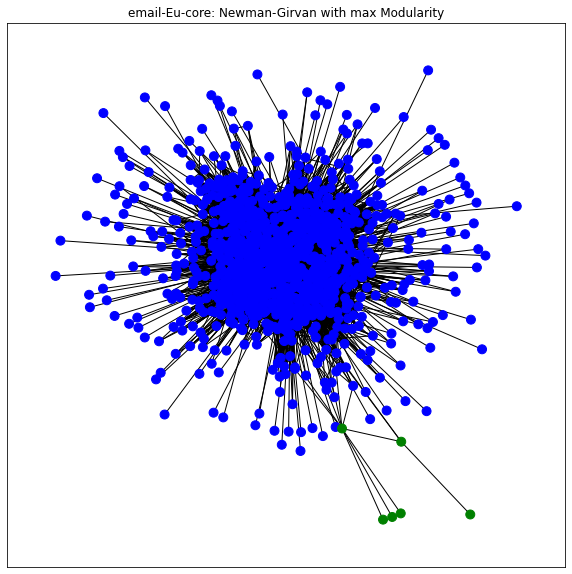

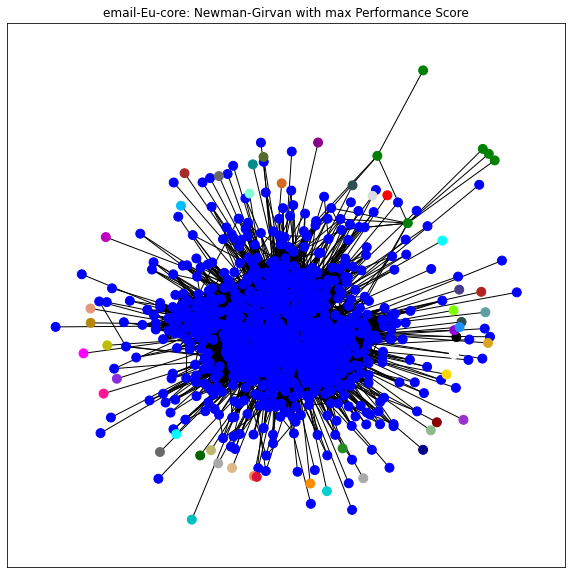

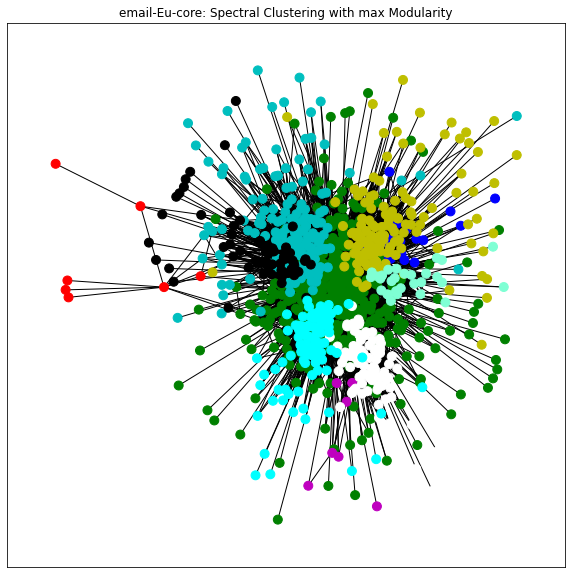

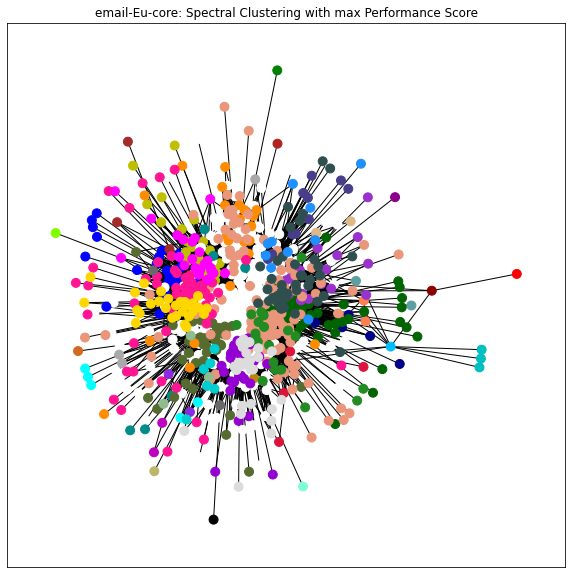

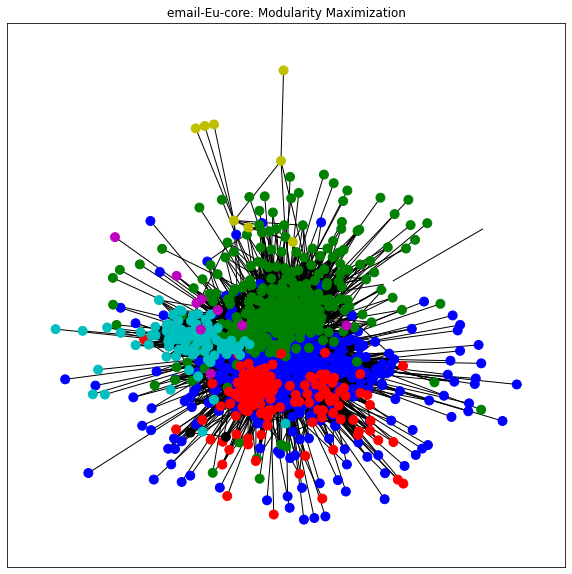

In [24]:
plot_communities(graph[7], NewmanGirvinResults[7][0], 'email-Eu-core: Newman-Girvan with max Modularity')

plot_communities(graph[7], NewmanGirvinResults[7][1], 'email-Eu-core: Newman-Girvan with max Performance Score')

plot_communities(graph[7], SpectralClusteringResults[7][0], 'email-Eu-core: Spectral Clustering with max Modularity')

plot_communities(graph[7], SpectralClusteringResults[7][1], 'email-Eu-core: Spectral Clustering with max Performance Score')

plot_communities(graph[7], ModMaxResults[7], 'email-Eu-core: Modularity Maximization')

Modularity Score για το Ground Truth partition 0.28801318862374214
Performance Score για το Ground Truth partition 0.9428136036490563


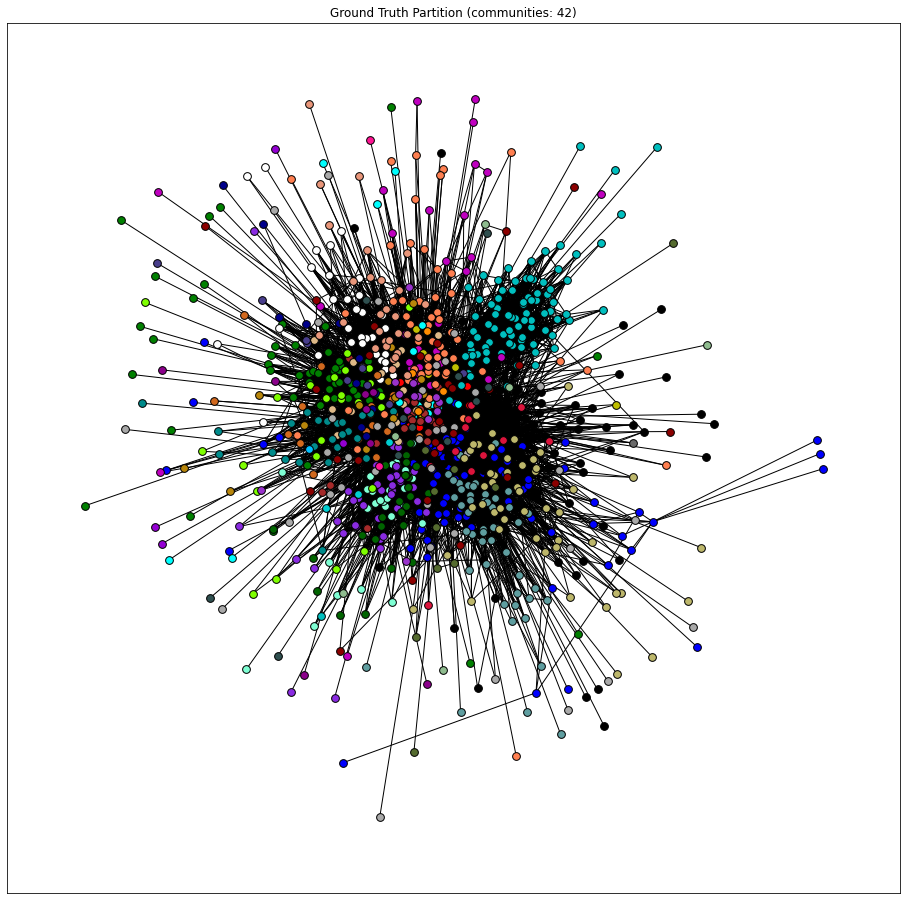

In [30]:
#για τη ground-truth
communities = {}

with open("email-Eu-core-department-labels.txt") as file:
    for l in file:
        x = l.split(' ')
        nodeNumber = str(x[0])
        communityNumber = str(x[1])
        if (nodeNumber in eu.subgraph(largest_eu).nodes):
            if (communityNumber not in communities.keys()):
                communities[communityNumber] = []
            communities[communityNumber].append(nodeNumber)

ground_truth_mod = nx.algorithms.community.quality.modularity(eu, communities.values())
ground_truth_perf = nx.algorithms.community.quality.partition_quality(eu, communities.values())[1]

ground_truth = communities.values()

print("Modularity Score για το Ground Truth partition", ground_truth_mod)
print("Performance Score για το Ground Truth partition", ground_truth_perf)

plt.figure(figsize= (16, 16))
plt.title('Ground Truth Partition (communities: ' + str(len(ground_truth)) + ')')
pos = nx.fruchterman_reingold_layout(eu)
nx.draw_networkx_edges(eu, pos = pos)
for (nodes, i) in zip(ground_truth, range(len(ground_truth))):
    n = nx.draw_networkx_nodes(eu, pos = pos, node_size = 60, nodelist = nodes, node_color = colors[i])
    n.set_edgecolor("black")
plt.show()

### **Σχολιασμός Αποτελεσμάτων:**

Βλέπουμε ότι με βάση την ground truth διαμέριση προκύπτουν 42 communities, όσα και τα παραρτήματα του ευρωπαϊκού ερευνητικού κέντρου. H τιμή του modularity είναι 0.29 και του performance 0.94 (υψηλότερη από αυτη του email-EU-core). Με βάση λοιπόν αυτή τη ground truth απεικόνιση των κοινοτήτων, μπορούμε να συμπεράνουμε τα εξής:

**Η μέθοδος Newman_Girvan** και με βάση το maximum Modularity score και με το Performance score δεν οδηγεί στον σχηματισμό ορθών κοινοτήτων. Εκτός από τις πολύ χαμηλές τιμές που επιστρέφει ως max modularity και ως max performance (0.0006 και 0.1394 αντίστοιχα), οι κοινότητες ως επί το πλήστον αποτελόυνται από ελάχιστους κόμβους (συχνά μόνο έναν) και υπάρχει μία κοινότητα που περιλαμβάνει την μεγάλη πλειοψηφία (το σύνολο των μπλε κόμβων στο κέντρο του γραφου, που καλύπτει σχεδόν την ολότητά του). Αυτό πιθανότατα οφείλεται στη χρήση του edge betweeness centrality ως κριτήριο διαμέρησης, η οποία στα SF δίκτυα, δεν είναι αποτελεσματική.

**Η μέθοδος Spectral Clustering** έχει τα καλύτερα αποτελέσματα όσον αφορά στον διαχωρισμό κοινοτήτων του email-Eu-core δικτύου. Μας επιστρέφει έως 23 communities (για μέγιστη τιμή performance), τα οποία αν και λιγότερα απ'τα 42 της ground truth φτάνουν πολύ κοντά στο "πραγματικό" αποτέλεσμα. Η τιμή του Modularity είναι 0.386 (πάλι μεγαλύτερη από της ground truth) και του performance 0.83, τιμή που πλησιάζει την 0.94 της ground-truth.

**H μέθοδοs Μodularity Μaximization** επίσης δεν επιτυγχάνει σχηματισμό ορθών κοινοτήτων. Σχηματίστηκαν 8 κοινότητες, που αν και λίγες είναι σχετικά ομοιόμορφες. Οι 4 μεγαλύτερες κοινότητες (με χρώματα πράσινο, πετρόλ, λαδί και cyan) έχουν παρόμοιο αριθμό κόμβων και οι 4 μικρότερες έχουν τουλάχιστον 2 κόμβους η κάθε μια. Η τιμή του Modularity score είναι 0.347 και του performance score 0.707. Βλέπουμε δηλαδή ελαφρώς μεγαλύτερη τιμή modularity από ό,τι στην ground truth διαμέριση, αλλά η τιμή του performance είναι μικρότερη, αλλά πλησιάζει το 0.94 της ground-truth.

#### Οπτικοποίηση κοινοτήτων REG

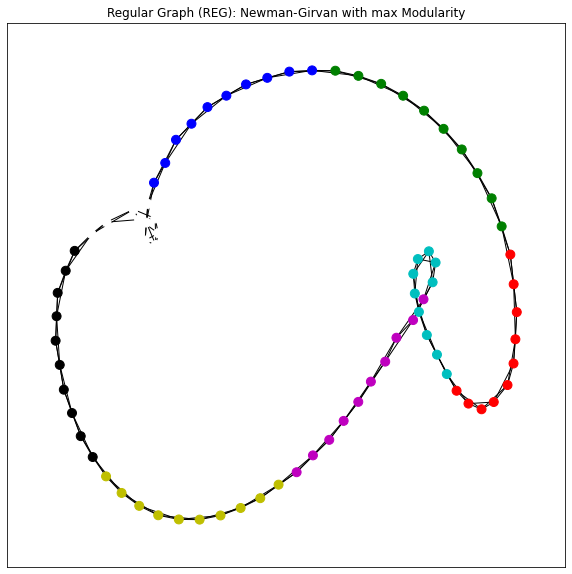

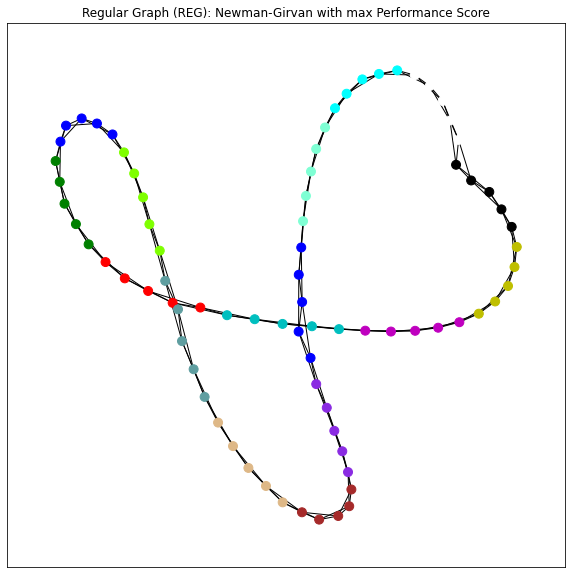

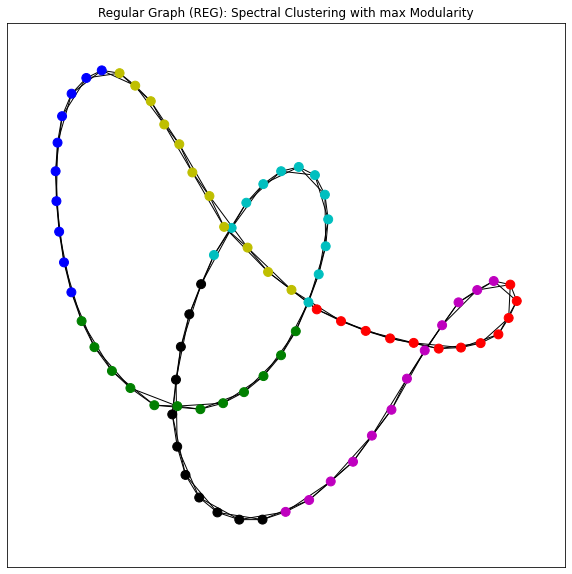

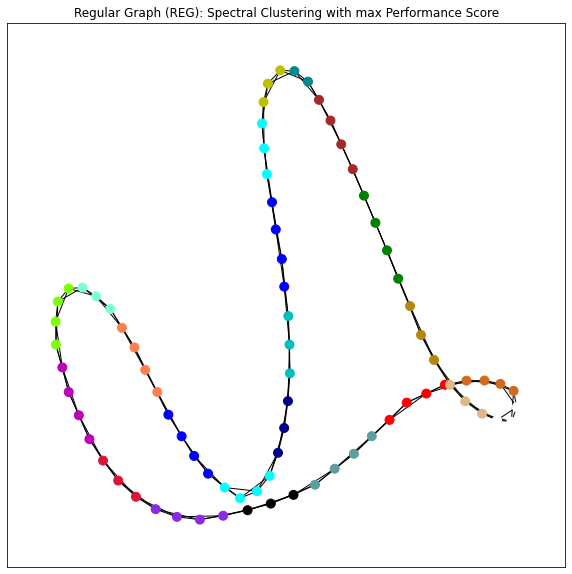

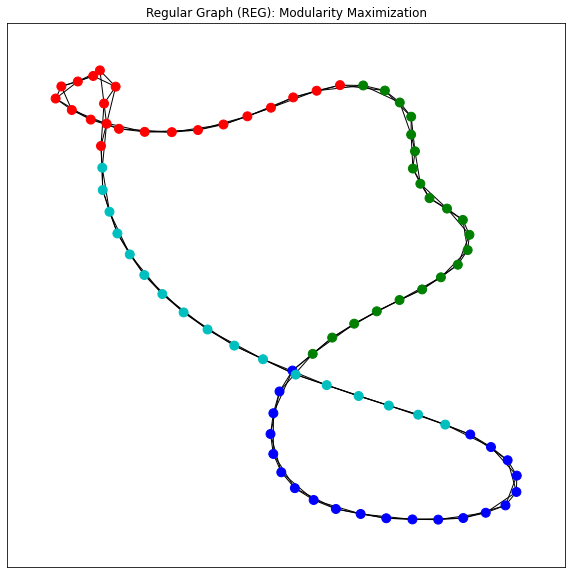

In [32]:
plot_communities(graph[0], NewmanGirvinResults[0][0], str(graph_name[0])+': Newman-Girvan with max Modularity')

plot_communities(graph[0], NewmanGirvinResults[0][1], str(graph_name[0])+': Newman-Girvan with max Performance Score')

plot_communities(graph[0], SpectralClusteringResults[0][0], str(graph_name[0])+': Spectral Clustering with max Modularity')

plot_communities(graph[0], SpectralClusteringResults[0][1], str(graph_name[0])+': Spectral Clustering with max Performance Score')

plot_communities(graph[0], ModMaxResults[0], str(graph_name[0])+': Modularity Maximization')

### **ΣΧΟΛΙΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ**
Για το REG λόγω της καθορισμένης διάταξης του είναι πιο εύκολη η δημιουργία και διάκριση κοινοτήτων καθώς οι αποστάσεις μεταξύ των κόμβων είναι καθορισμένες από τη γεωμετρία του γραφήματος. Παρατηρούμε σχεδόν άριστo performance από όλες τις μεθόδους με μικρή πτώση στην Modularity Maximization. Οι μέθοδοι παράγουν παρόμοια μεγέθη κοινοτήτων με την μικρότερη να είναι 4 με τη μέθοδο Modularity Maximization. Οι κοινότητες έχουν σχεδόν βέλτιστο αποτέλεσμα καθώς η διάκριση του είναι εύκολη στον χώρο έτσι όπως έχουν τοποθετηθεί.

#### Οπτικοποίηση κοινοτήτων RGER

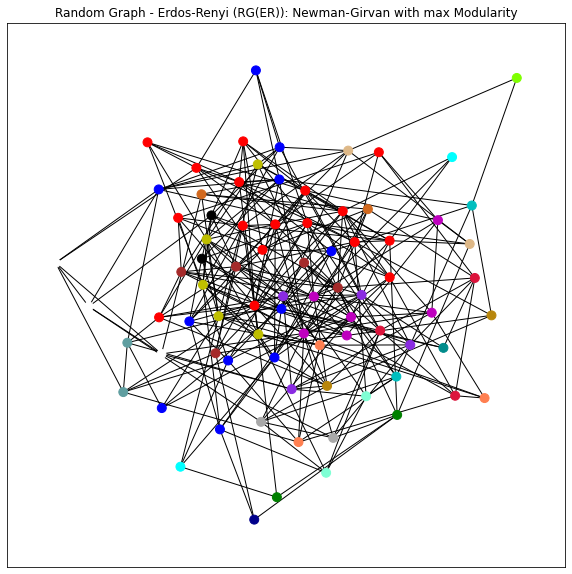

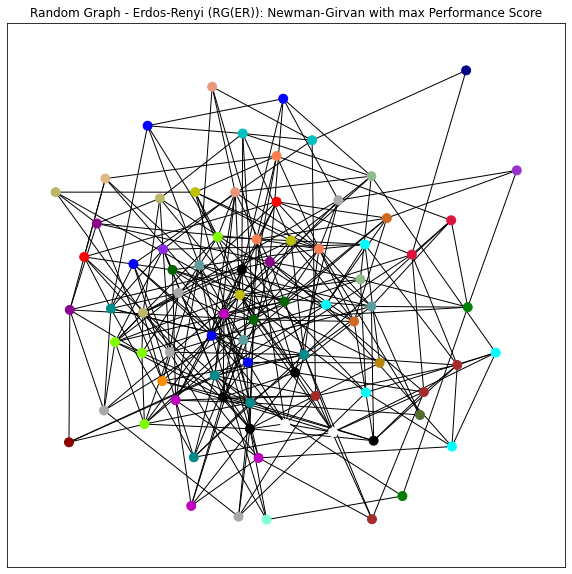

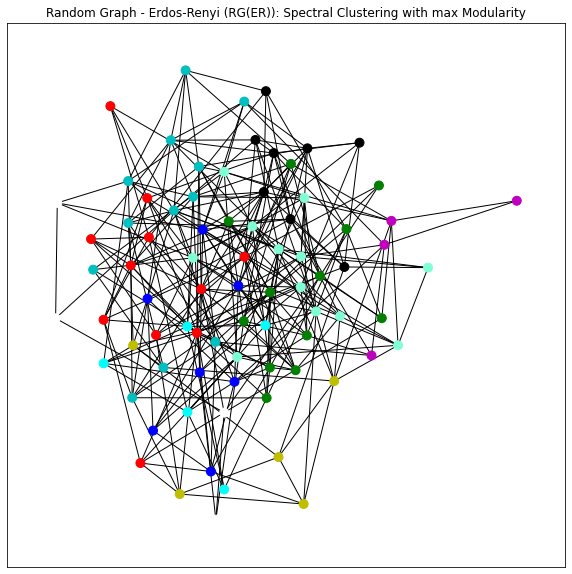

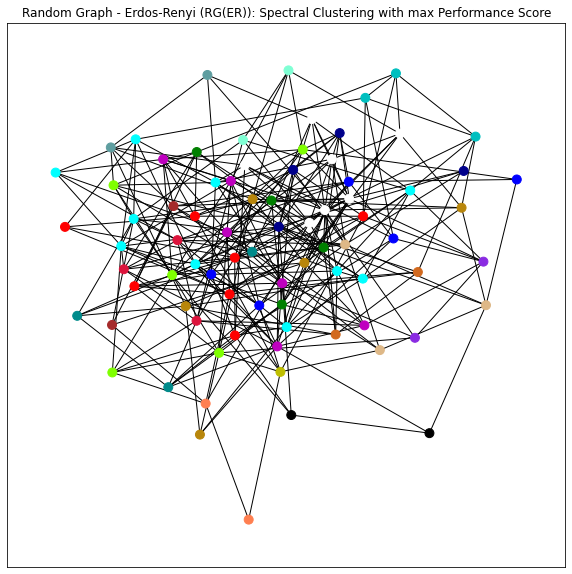

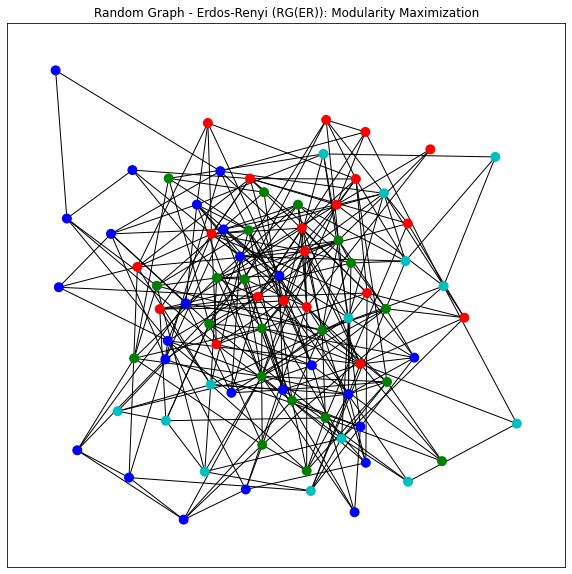

In [33]:
plot_communities(graph[1], NewmanGirvinResults[1][0], str(graph_name[1])+': Newman-Girvan with max Modularity')

plot_communities(graph[1], NewmanGirvinResults[1][1], str(graph_name[1])+': Newman-Girvan with max Performance Score')

plot_communities(graph[1], SpectralClusteringResults[1][0], str(graph_name[1])+': Spectral Clustering with max Modularity')

plot_communities(graph[1], SpectralClusteringResults[1][1], str(graph_name[1])+': Spectral Clustering with max Performance Score')

plot_communities(graph[1], ModMaxResults[1], str(graph_name[1])+': Modularity Maximization')

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Η Newman-Girvan παράγει 24 και 34 κοινότητες για max modularity και max performance αντίστοιχα ενώ η spectral clustering 17 και 50. H modularity maximazation δίνει μόνο 4. Τα παραπάνω αποτελέσματα συμφωνούν με την θεωρία και όσα αναμέναμε. Δηλαδή για τυχαίο γράφημα που η σύνδεση των κόμβων του γίνεται τυχαία η πιθανότητα να βρούμε κοινότητες είναι αρκετά μικρή (αναμενόμενο).

#### Οπτικοποίηση κοινοτήτων RGG

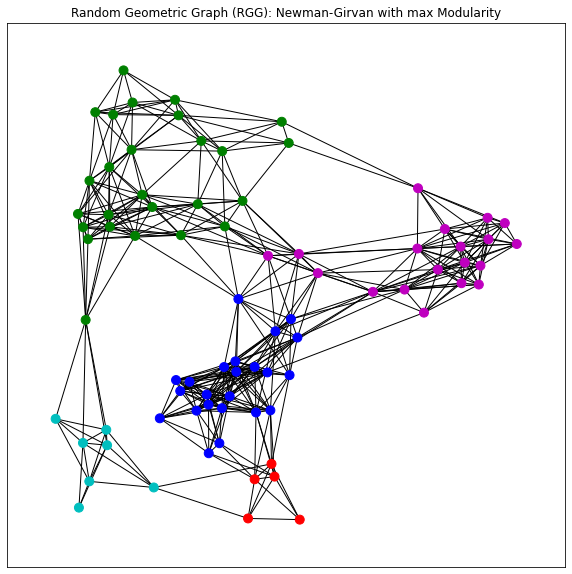

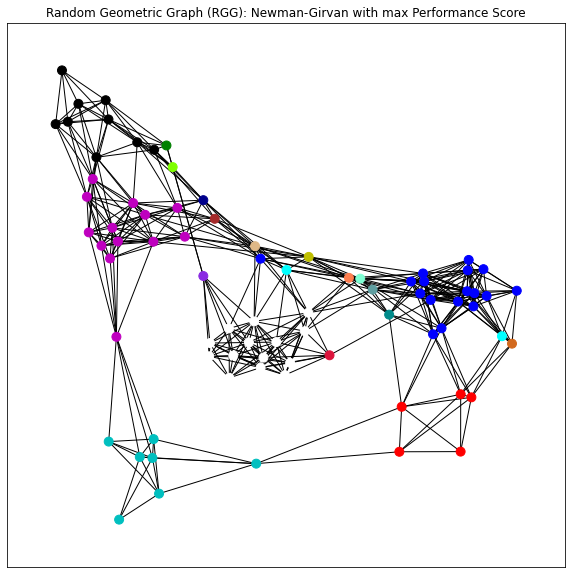

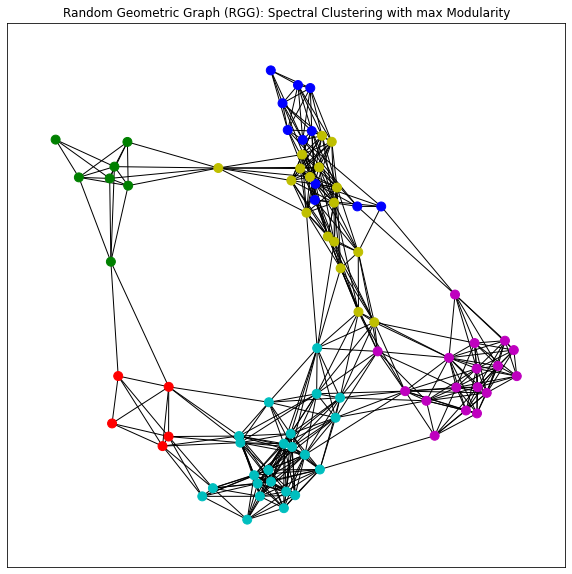

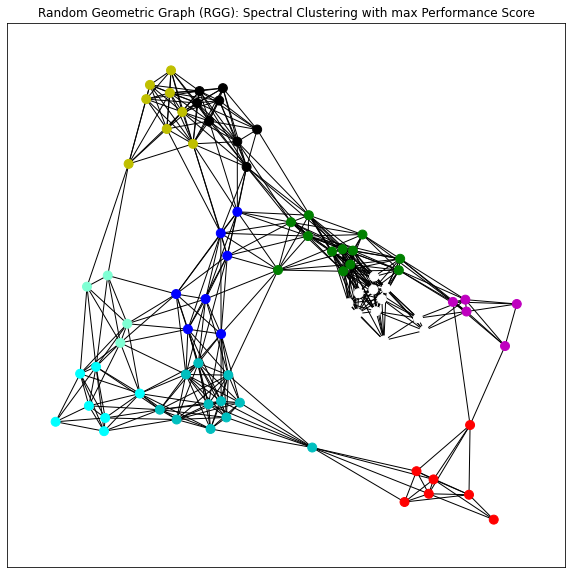

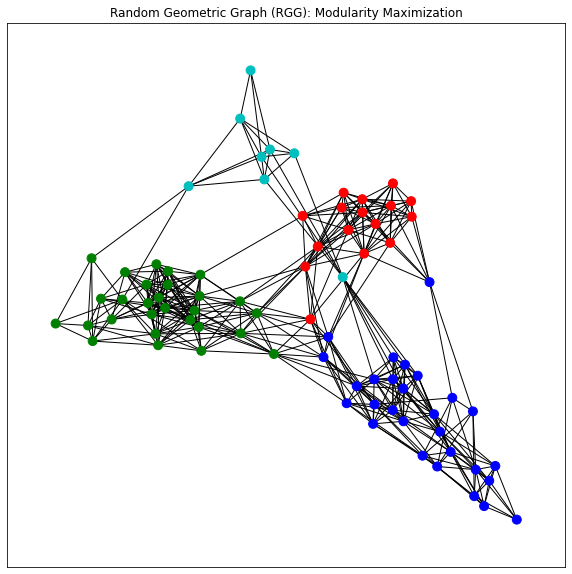

In [34]:
plot_communities(graph[2], NewmanGirvinResults[2][0], str(graph_name[2])+': Newman-Girvan with max Modularity')

plot_communities(graph[2], NewmanGirvinResults[2][1], str(graph_name[2])+': Newman-Girvan with max Performance Score')

plot_communities(graph[2], SpectralClusteringResults[2][0], str(graph_name[2])+': Spectral Clustering with max Modularity')

plot_communities(graph[2], SpectralClusteringResults[2][1], str(graph_name[2])+': Spectral Clustering with max Performance Score')

plot_communities(graph[2], ModMaxResults[2], str(graph_name[2])+': Modularity Maximization')

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Στοn RGG παράγονται 5 και 22 κοινότητες για Νewman-Girvin αν μετράμε με βάση το modularity score και το performance score αντίστοιχα. Ενώ 6 και 13 για τον spectral clustering και τέλος 4 για τον greedy modularity. Στα διαγράμματα οι κοινότητες είναι ευδιάκριτες. Γενικά απ'τα χαρακτηριστικά του γράφου (ο κόμβος συνδέεται με κόμβους μέσα σε μια ακτίνα) περιμένουμε να δημιουργούνται κοινότητες γύρω απο ένα κεντρικό κόμβο.

#### Οπτικοποίηση κοινοτήτων SF

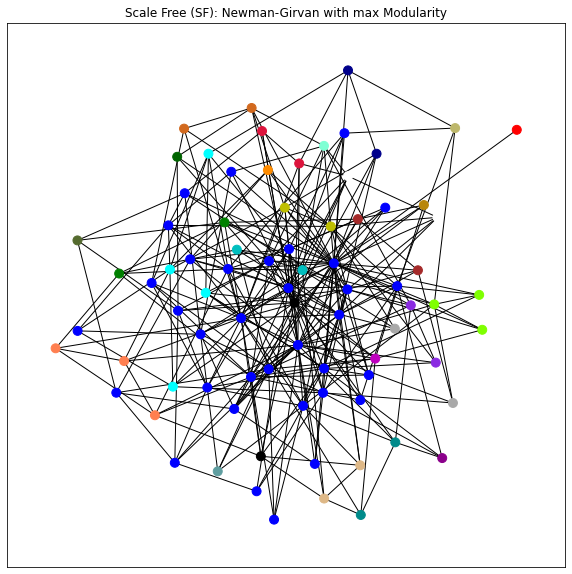

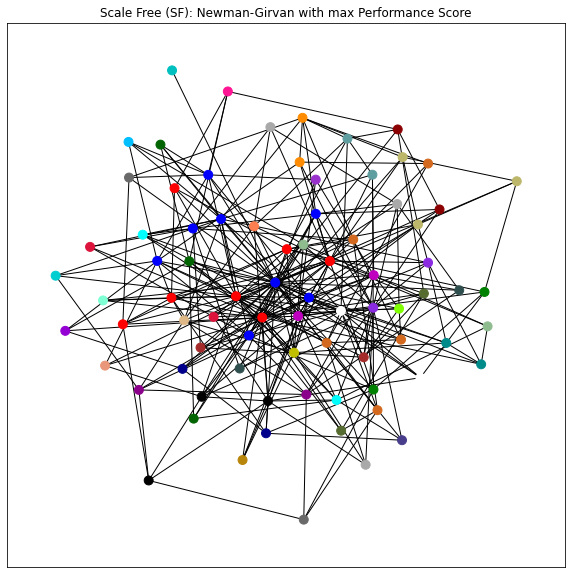

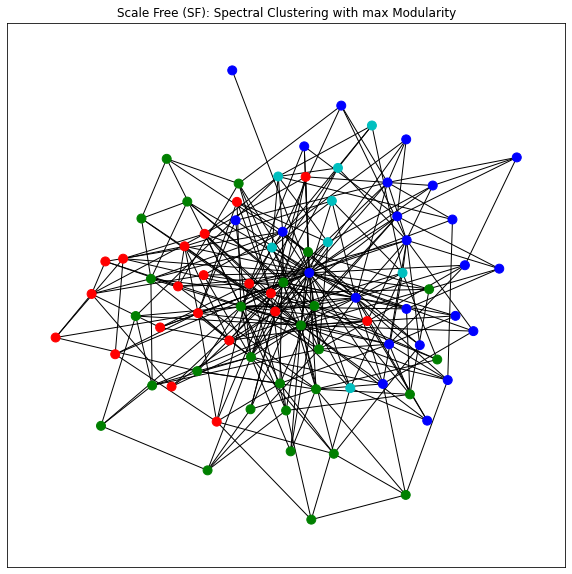

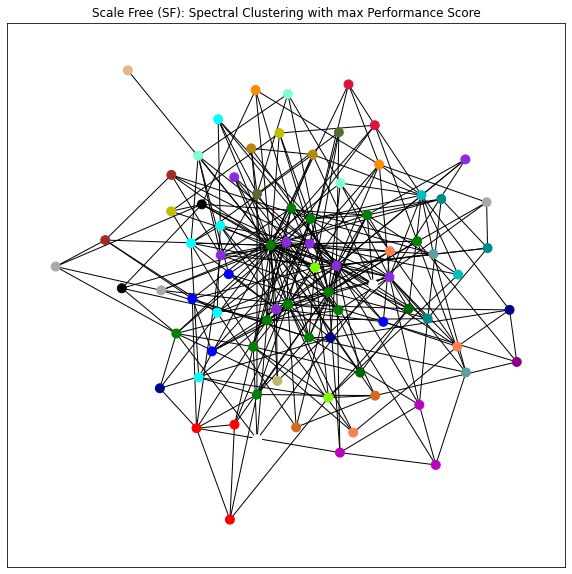

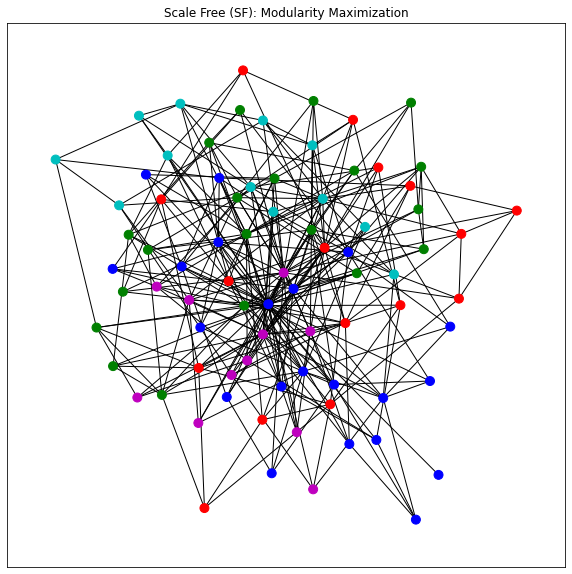

In [35]:
plot_communities(graph[3], NewmanGirvinResults[3][0], str(graph_name[3])+': Newman-Girvan with max Modularity')

plot_communities(graph[3], NewmanGirvinResults[3][1], str(graph_name[3])+': Newman-Girvan with max Performance Score')

plot_communities(graph[3], SpectralClusteringResults[3][0], str(graph_name[3])+': Spectral Clustering with max Modularity')

plot_communities(graph[3], SpectralClusteringResults[3][1], str(graph_name[3])+': Spectral Clustering with max Performance Score')

plot_communities(graph[3], ModMaxResults[3], str(graph_name[3])+': Modularity Maximization')

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Η μέθοδος Newman-Girvan παράγει 30 και 43 κοινότηες, η spectral clustering 4 και 31 κοινότητες ενώ η modularity maximization δίνει 5. Στα SF γραφήματα περιμένουμε κοινότητες γύρω από τους κόμβους μεγάλου βαθμού και σχετικά εύκολη διάκριση μεταξύ τους.

#### Οπτικοποίηση κοινοτήτων SW

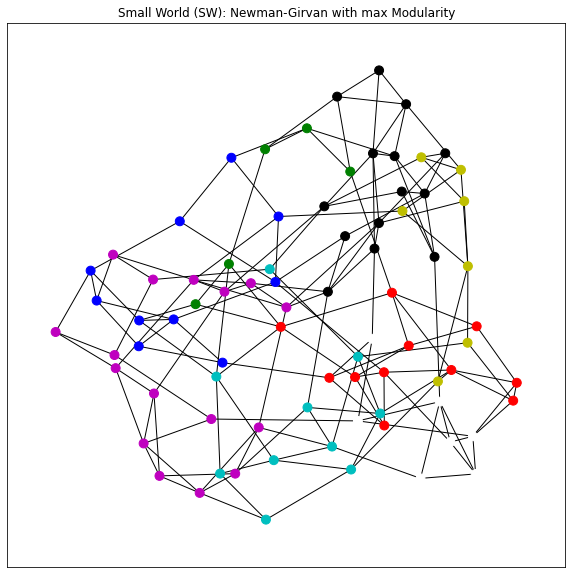

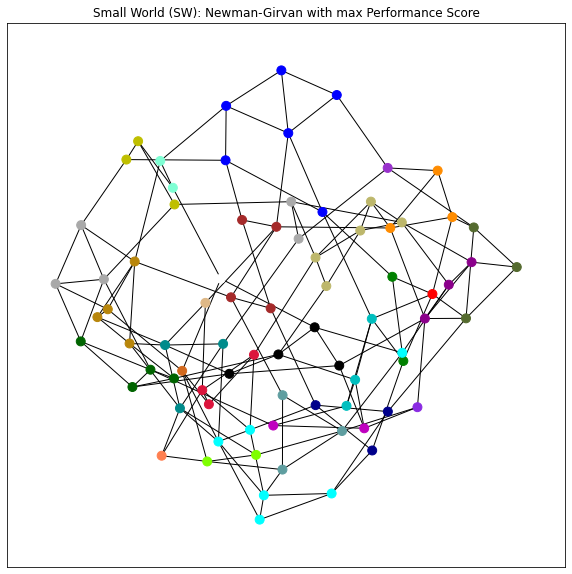

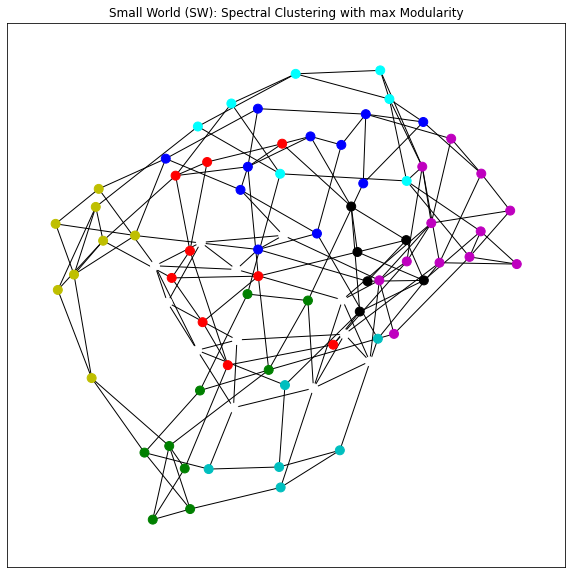

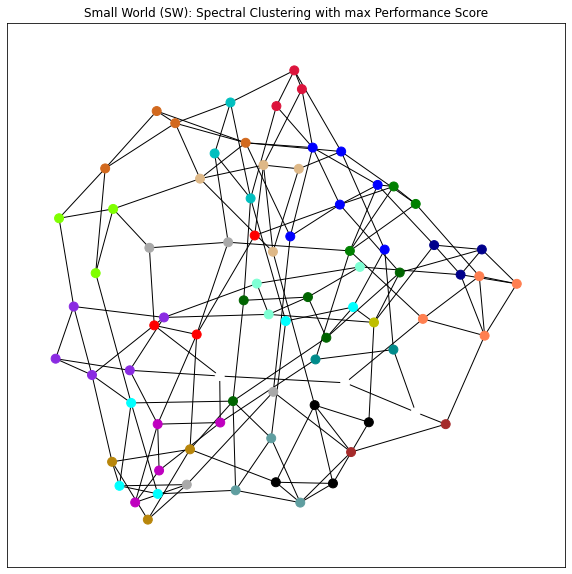

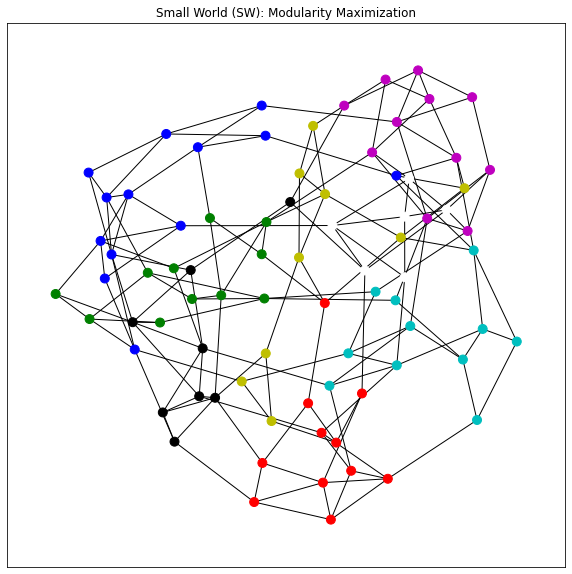

In [39]:
plot_communities(graph[4], NewmanGirvinResults[4][0], str(graph_name[4])+': Newman-Girvan with max Modularity')

plot_communities(graph[4], NewmanGirvinResults[4][1], str(graph_name[4])+': Newman-Girvan with max Performance Score')

plot_communities(graph[4], SpectralClusteringResults[4][0], str(graph_name[4])+': Spectral Clustering with max Modularity')

plot_communities(graph[4], SpectralClusteringResults[4][1], str(graph_name[4])+': Spectral Clustering with max Performance Score')

plot_communities(graph[4], ModMaxResults[4], str(graph_name[4])+': Modularity Maximization')

### **ΣΧΟΛΙΑΣΜΟΣ ΑΠΟΤΕΛΕΣΜΑΤΩΝ:**
Στα SW γραφήματα αναμέναμε να σχηματιστούν κοινότητες γύρω από τους κόμβους με μεγάλο βαθμό. Αν και παρατηρούμε διακυμάνσεις στο modularity μεταξύ των διαφορετικών μεθόδων προσέγγισης (με την σημαντικότερη να είναι η spectral clustering για max performance) οπτικά έχουμε στις περισσότερες περιπτώσεις θετικά (αναμενόμενα) αποτελέσματα.